# -------------------------------------------------------------------------
#  Map USGS, Reservoir, Power Plant, and SERC area with Cartopy
## Spring 2016
## Ryan Niemeyer, UW Hydro
# -------------------------------------------------------------------------

In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import cartopy.io.shapereader as shpreader
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
import calendar
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import numpy as np

In [2]:
%matplotlib inline

In [8]:
# ------------------- network file -------------------
filepath = '/raid3/rniemeyr/RBM/two_layer_model/RBM_Yixin/RIPS/model_run/source/VIC_RBM/RBM_processing/output/Tennessee20160823_RBM-orig_new_flow.Spat'
network = pd.read_table(filepath,delim_whitespace=True,header=None)
network.columns = ['spat1','spat2','spat3','spat4','lat','lon','seg']
c_maxes = network.groupby(['lat', 'lon'])
network2 = network.drop_duplicates(subset=['lat', 'lon'], take_last=True)

# ------------------- river file -------------------
filepath = '/raid3/rniemeyr/RBM/data/mapping_data/google_earth_engine/Tennessee_large_rivers2.csv'
river_latlon = pd.read_csv(filepath, header=None)
river_latlon.columns = ['index','lon','lat']
river_latlon = river_latlon[ ['lat','lon']]
river_latlon = river_latlon[river_latlon.index != 0]  # drop top row with names

# ------------------- large river file -------------------
filepath = '/raid3/rniemeyr/RBM/data/mapping_data/google_earth_engine/EasternUS_large_rivers.csv'
river_latlon = pd.read_csv(filepath, header=None)
river_latlon.columns = ['index','lon','lat']
river_latlon = river_latlon[ ['lat','lon']]
river_latlon = river_latlon[river_latlon.index != 0]  # drop top row with names

# ------------------- medium river file -------------------
filepath = '/raid3/rniemeyr/RBM/data/mapping_data/google_earth_engine/EasternUS_medium_rivers.csv'
river_med_latlon = pd.read_csv(filepath, header=None)
river_med_latlon.columns = ['index','lon','lat']
river_med_latlon = river_med_latlon[ ['lat','lon']]
river_med_latlon = river_med_latlon[river_med_latlon.index != 0]  # drop top row with names

# ---------- power plant data ---------------------
file_temp = '/raid3/rniemeyr/RBM/data/power_plants/MaxDischarge_SERCFleet_18Aug2016.csv'
power_plant_data = pd.read_csv(file_temp)

# ---------- power plant data - Yifan version ---------------------
file_temp = '/raid3/rniemeyr/RBM/data/power_plants/SERC_map_powerplant_info_cata.csv'
power_plant_data2 = pd.read_csv(file_temp)

# ---------------- reservoir data --------------
file_temp = '/raid3/rniemeyr/RBM/two_layer_model/RBM_Yixin/RIPS/model_run/source/VIC_RBM/tools/cfg/reservoir_to_model_total.csv'
reservoir_data = pd.read_csv(file_temp)

# ------------------- power plant stats -------------------
filepath = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/thermal_Q_2015_once_throughh.csv'
power_plant_Q = pd.read_csv(filepath, header=None)
power_plant_Q.columns =  ['ID','lat','lon','mean_thermal_Q','min_thermal_Q','max_thermal_Q']
power_plant_Q = power_plant_Q[power_plant_Q.index != 0]  # drop top row with names

#------- USGS sites within lat/lon box around SERC area -----------------
file_temp = '/raid3/rniemeyr/RBM/data/USGS/NWISMapperExport2.csv'
USGS2_summary_names = pd.read_csv(file_temp,  nrows=1, header=None)
USGS2_summary = pd.read_csv(file_temp,   sep=',', dtype={'SiteNumber': object}) #sep='","'
USGS2_summary = USGS2_summary.rename(columns=lambda x: x.strip())  # strip white space

#------- USGS flow sites within lat/lon box around SERC area -----------------
#file_temp = '/raid3/rniemeyr/RBM/data/USGS/NWISMapperExport_flow3.csv'
file_temp = '/raid3/rniemeyr/RBM/data/USGS/NWISMapperExport_flow_cfs3.csv'
USGS2_summary_names2 = pd.read_csv(file_temp,  nrows=1, header=None)
USGS2_summary_flow = pd.read_csv(file_temp,   sep=',', dtype={'SiteNumber': object}) #sep='","'
USGS2_summary_flow = USGS2_summary_flow.rename(columns=lambda x: x.strip())  # strip white space

# -------------- list of USGS temperature and flow sites near once-through power plant sites -----
file_name = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/USGS_near_power_plants_site_list.csv'
USGS_power_summary_names = pd.read_csv(file_name,  nrows=1, header=None)
USGS_power_summary = pd.read_csv(file_name,   sep=',', dtype={'SiteNumber': object}) #sep='","'
USGS_power_summary = USGS_power_summary.rename(columns=lambda x: x.strip())  # strip white space

# -------------- list of USGS temperature and flow sites near once-through power plant sites -----
file_name = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/USGS_near_power_plants_site_temp_stats.csv'
USGS_power_temp_stats = pd.read_csv(file_name,   sep=',', dtype={'site': object}) #sep='","'
USGS_power_temp_stats = USGS_power_temp_stats.rename(columns=lambda x: x.strip())  # strip white space

file_name = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/USGS_near_power_plants_site_flow_stats.csv'
USGS_power_flow_stats = pd.read_csv(file_name,   sep=',', dtype={'site': object}) #sep='","'
USGS_power_flow_stats = USGS_power_flow_stats.rename(columns=lambda x: x.strip())  # strip white space

# ------------ max weekly temperature ---------------
file_name = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/USGS_max_week_temp.csv'
USGS_RBM_temp_max_week = pd.read_csv(file_name)

# ------------ min weekly flow ---------------
file_name = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/data/min_flow_stats.csv'
USGS_RBM_flow_min_week = pd.read_csv(file_name, header=None)
USGS_RBM_flow_min_week.columns = ['site_no','tot_years', 
                    'min_daily_flow_min','min_daily_flowp_max' , 'min_daily_flow_mean',
                    'min_daily_flow_day_min','min_daily_flow_day_max' , 'min_daily_flow_day_mean',
                    'min_mean_wkly_flow_min','min_mean_wkly_flow_max' , 'min_mean_wkly_flow_mean',
                    'min_mean_wkly_flow_day_min','min_mean_wkly_flow_day_max' , 'min_mean_wkly_flow_day_mean'
                   ]

# ----------- list of USGS sites -----------------
filepath = '/raid3/rniemeyr/RBM/thermal_plant_sensitivity/analysis/thermal_plant_usgs_site_list.csv'
plant_usgs_list = pd.read_csv(filepath, header=None)
plant_usgs_list.columns =  ['indexi','plant_ID','USGS_temp','USGS_flow','Mississippi']
plant_usgs_list = plant_usgs_list[plant_usgs_list.index != 0]  # drop top row with names


/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: the take_last=True keyword is deprecated, use keep='last' instead
/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [46]:
# ========== match up the lat/lons with the specific sites

site_list = USGS2_summary_flow.SiteNumber.astype(int)
flow_to_stats = pd.DataFrame()

for sitex in USGS_RBM_flow_min_week.site_no:
    xloc = site_list.ix[site_list == sitex]
    xloc = pd.DataFrame([xloc])
    xloc = xloc.transpose()
    flow_to_stats = flow_to_stats.append(xloc)
    
USGS_RBM_flow_min_week.lon = USGS2_summary_flow.ix[flow_to_stats.index.astype(int)].SiteLongitude
USGS_RBM_flow_min_week.lat = USGS2_summary_flow.ix[flow_to_stats.index.astype(int)].SiteLatitude 

In [47]:

# ------------large rivers data ------
lats_river = river_latlon.lat.astype(np.float)
lons_river = river_latlon.lon.astype(np.float)

# ------------large rivers data ------
lats_river_med = river_med_latlon.lat.astype(np.float)
lons_river_med  = river_med_latlon.lon.astype(np.float)

# ---------------------------------------------
#  Ryan's power plant data
# ---------------------------------------------

# ------------ power plant data ------
lats_power = power_plant_data[power_plant_data['Simple Cooling Type']=='once through'].Latitude
lons_power = power_plant_data[power_plant_data['Simple Cooling Type']=='once through'].Longitude

# ------------ power plant data ------
lats_power2 = power_plant_data[power_plant_data['Simple Cooling Type']=='recirculating'].Latitude
lons_power2 = power_plant_data[power_plant_data['Simple Cooling Type']=='recirculating'].Longitude

# ------------ power plant data ------
lats_power3 = power_plant_data.Latitude
lons_power3 = power_plant_data.Longitude

# ---------------------------------------------
#  Yifan's power plant data
# ---------------------------------------------

power_plant_data3 = power_plant_data2[power_plant_data2.Cooling_cata==1]

# ------------ power plant data ------
lats_powerY = power_plant_data2[power_plant_data2.Cooling_cata==1].Latitude
lons_powerY = power_plant_data2[power_plant_data2.Cooling_cata==1].Longitude

# ------------ marker size based heat -----------------
marker_size_heat = power_plant_data2[power_plant_data2.Plant_cata==1]
marker_size_heat = marker_size_heat['Capacity (MW)']/300

# ------------ power plant data ------
lats_power_q = power_plant_Q.lat
lons_power_q = power_plant_Q.lon

# ------------ power plant data - once-through ------
lats_power_oncethrough = USGS_power_summary.lat_power
lons_power_oncethrough = USGS_power_summary.lon_power
lats_temp = USGS_power_summary.lat_temp
lons_temp = USGS_power_summary.lon_temp
lats_flow = USGS_power_summary.lat_flow
lons_flow = USGS_power_summary.lon_flow

# ---------------- network data -------------
lats_network = network2.lat
lons_network = network2.lon

# -------- remove outliers from data ------------
USGS_RBM_temp_max_week = USGS_RBM_temp_max_week[USGS_RBM_temp_max_week.temperature < 35]
USGS_RBM_temp_max_week = USGS_RBM_temp_max_week[USGS_RBM_temp_max_week.temperature > 15]

#USGS_RBM_flow_min_week = USGS_RBM_flow_min_week[USGS_RBM_flow_min_week.flow_min_week < 5000]
#USGS_RBM_flow_min_week.flow_min_week[USGS_RBM_flow_min_week.flow_min_week < 1] = 1

flow_min_log = np.log10(USGS_RBM_flow_min_week.min_mean_wkly_flow_mean)


flow_min_log2 = np.log10(USGS_power_flow_stats.min_mean_wkly_flow_mean)



In [9]:
plant_usgs_list.head()

,indexi,plant_ID,USGS_temp,USGS_flow,Mississippi
1,0,3_B_1,2469100,2429500,no
2,1,7_G_1,2397000,2400500,no
3,2,8_B_10,2453500,2453500,no
4,3,10_B_1,2453500,2466030,no
5,4,26_B_1,2405500,2407000,no


In [157]:
USGS_RBM_temp_max_week.head()

,Unnamed: 0,site_no,lon,lat,temperature,days
0,0,1490120,-76.094167,38.501667,30.442857,1019
1,0,1490140,-76.083889,38.445278,31.585714,1499
2,0,1490200,-76.088556,38.318472,28.957143,379
3,0,1621050,-78.960307,38.486790,25.842857,910
4,0,1622000,-78.913639,38.340405,25.600000,749


In [149]:
np.log10(50)

1.6989700043360187

# ----------------------------------------------------------------------------------------
#    Maps
# ----------------------------------------------------------------------------------------

In [82]:

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower ofset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax/(vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highets point in the colormap's range.
          Defaults to 1.0 (no upper ofset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap

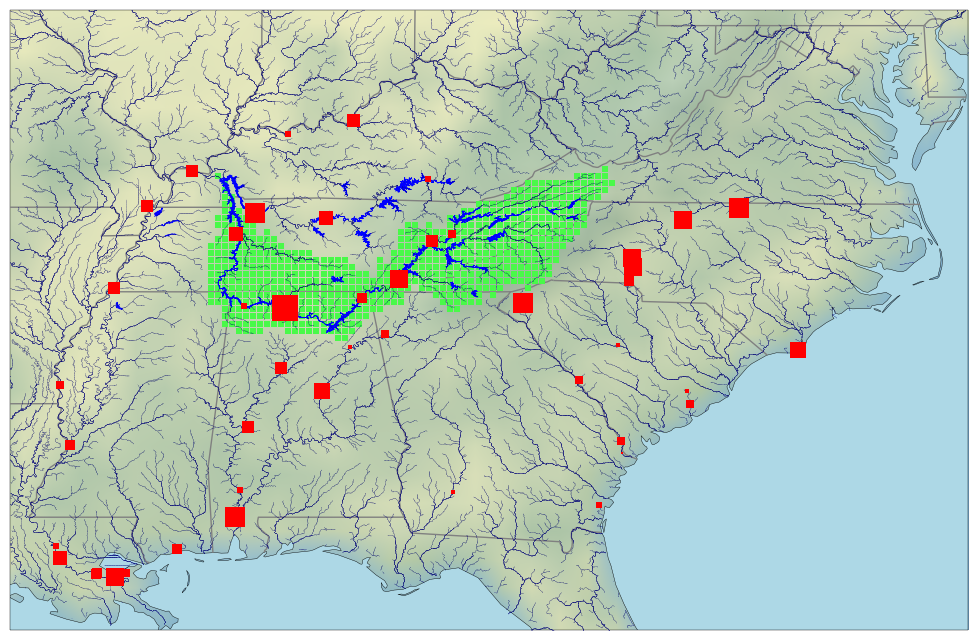

In [6]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],'s', zorder=12, 
                 markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/200 + 2, color='red', 
                 transform=ccrs.Geodetic())

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    reader = shpreader.Reader(shpfilename)
    lakes = reader.records()
    for lake in lakes:
        if lake.attributes['AREASQKM'] > 20:
            ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



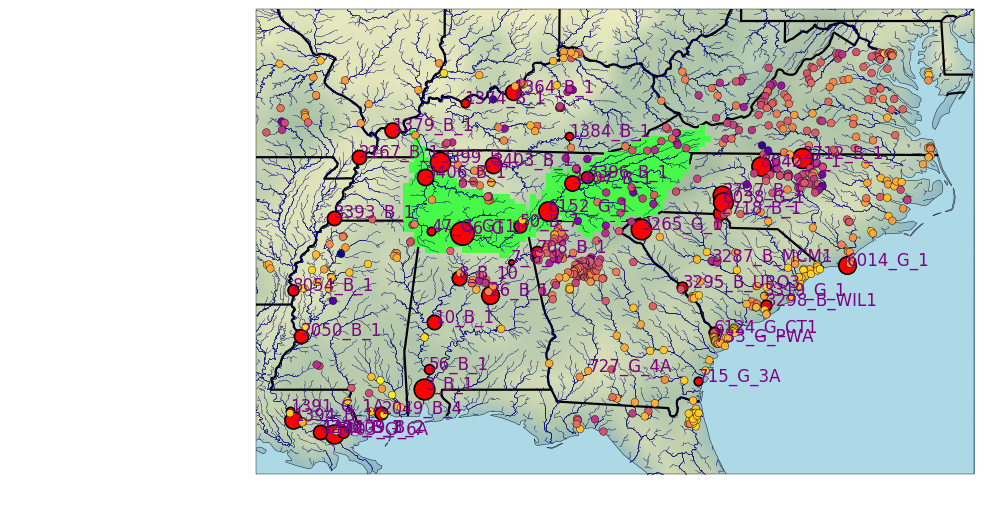

In [82]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=30,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')


    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

        ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[i]], 
                (power_plant_data3.Longitude[power_plant_data3.index[i]], 
                  power_plant_data3.Latitude[power_plant_data3.index[i]]),
                  fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

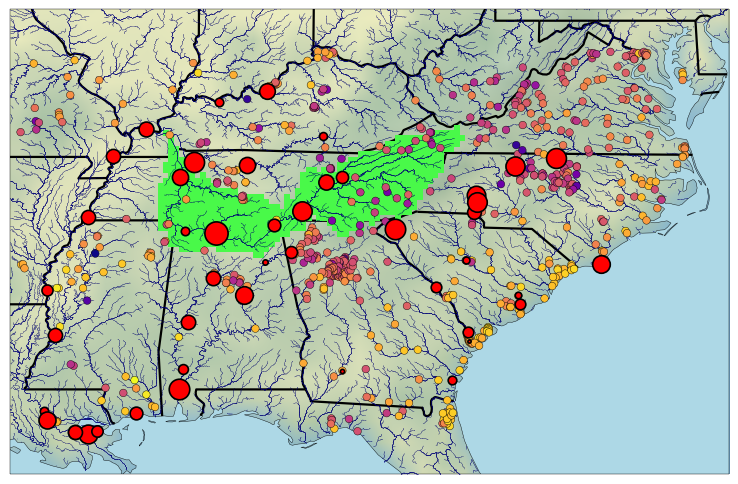

In [140]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=30,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')


    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=18, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

        #ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[i]], 
        #        (power_plant_data3.Longitude[power_plant_data3.index[i]], 
        #          power_plant_data3.Latitude[power_plant_data3.index[i]]),
        #          fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

In [120]:
#power_plant_data3['UniqueID_Final']==''

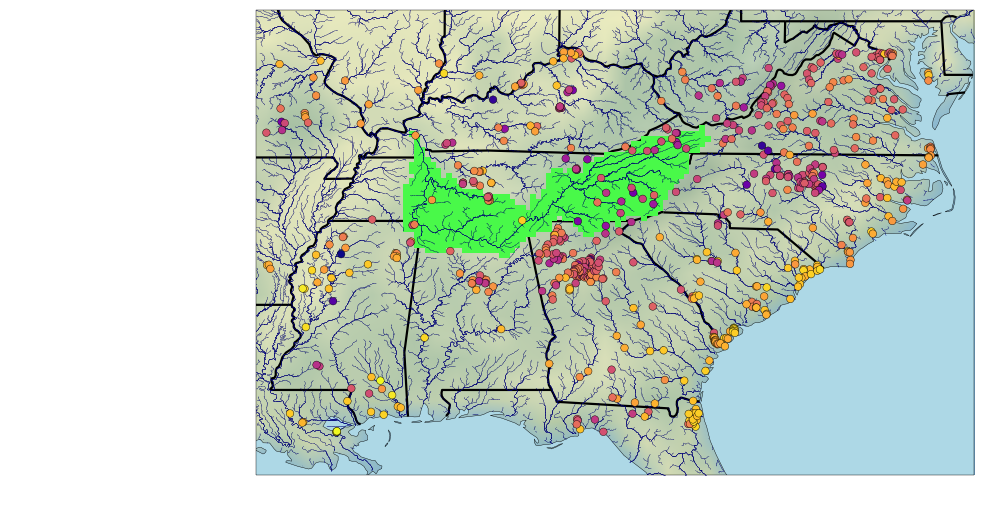

In [121]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    #ax.set_extent([-82, -77, 35, 37]) # upper appalachia
    #ax.set_extent([-88, -83, 32, 35]) # lower appalachia
    #ax.set_extent([-88, -86, 32, 33]) # alabama stations
    #ax.set_extent([-90.5, -89, 36, 37.8]) # alabama stations
    #ax.set_extent([-85.5, -83.5, 36, 37.5]) # lower appalachia

    #ax.set_extent([-81.6, -80.8, 33.5, 34.5]) # upper appalachia
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    
    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=30,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')

    xname = '2168_B_MB1'
    plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]], 
                power_plant_data3.Latitude[power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]]/12 + 4, color='red')

    ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]], 
                (power_plant_data3.Longitude[power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]], 
                  power_plant_data3.Latitude[power_plant_data3.index[power_plant_data3['UniqueID_Final']==xname]]),
                  fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

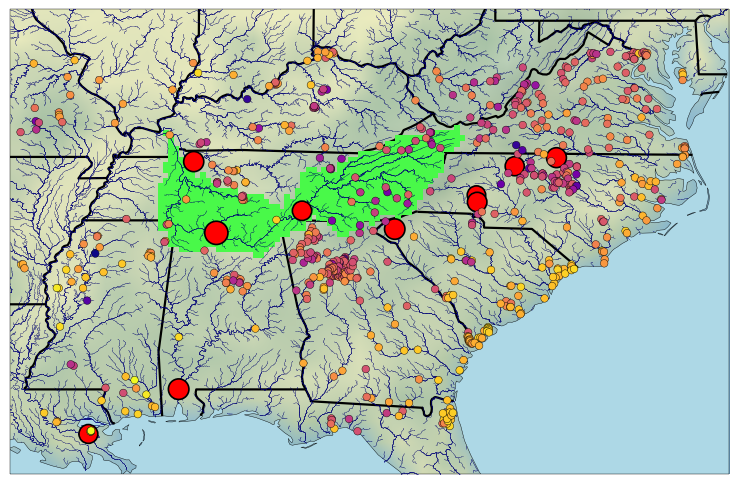

In [137]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    #ax.set_extent([-82, -77, 35, 37]) # upper appalachia
    #ax.set_extent([-88, -83, 32, 35]) # lower appalachia
    #ax.set_extent([-88, -86, 32, 33]) # alabama stations
    #ax.set_extent([-90.5, -89, 36, 37.8]) # alabama stations
    #ax.set_extent([-85.5, -83.5, 36, 37.5]) # lower appalachia

    #ax.set_extent([-81.6, -80.8, 33.5, 34.5]) # upper appalachia
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    
    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=30,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')

    plt.scatter(lonx3, latx3,
         edgecolor='black', zorder=12, linewidth='1.2',
         s=capacity_power/12 + 4, color='red')

    #ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]], 
    #            (power_plant_data3.Longitude[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]], 
    #              power_plant_data3.Latitude[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]]),
    #              fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

In [ ]:
capacity_power = power_plant_data3['Capacity (MW)']
capacity_power = capacity_power[power_plant_data3.index[power_plant_data3['Capacity (MW)']>1500]]
latxi = power_plant_data3.Latitude
lonxi = power_plant_data3.Longitude

latx3 = latxi[power_plant_data3.index[power_plant_data3['Capacity (MW)']>1500]]
lonx3 = lonxi[power_plant_data3.index[power_plant_data3['Capacity (MW)']>1500]]

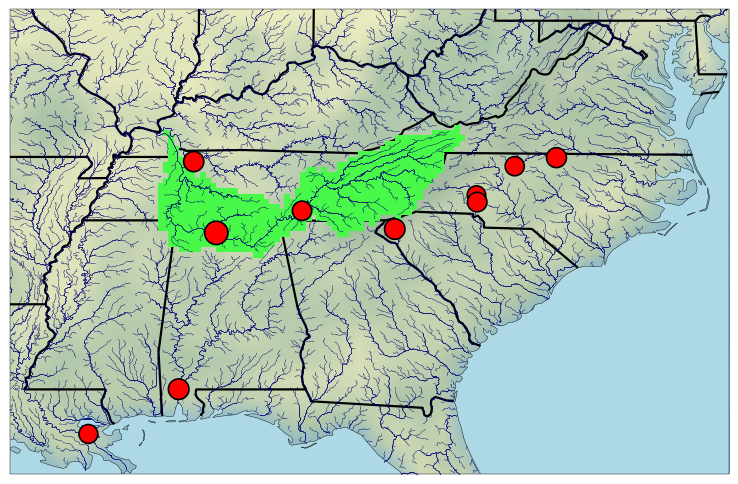

In [138]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    #ax.set_extent([-82, -77, 35, 37]) # upper appalachia
    #ax.set_extent([-88, -83, 32, 35]) # lower appalachia
    #ax.set_extent([-88, -86, 32, 33]) # alabama stations
    #ax.set_extent([-90.5, -89, 36, 37.8]) # alabama stations
    #ax.set_extent([-85.5, -83.5, 36, 37.5]) # lower appalachia

    #ax.set_extent([-81.6, -80.8, 33.5, 34.5]) # upper appalachia
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    
    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(lonx3, latx3,
         edgecolor='black', zorder=12, linewidth='1.2',
         s=capacity_power/12 + 4, color='red')

    #ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]], 
    #            (power_plant_data3.Longitude[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]], 
    #              power_plant_data3.Latitude[power_plant_data3.index[power_plant_data3['Capacity (MW)']>xname]]),
    #              fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

In [57]:
latx = np.array(USGS_RBM_flow_min_week.lat)
lonx = np.array(USGS_RBM_flow_min_week.lon)


In [65]:
latx2 = latx[flow_min_log>3.5]
lonx2 = lonx[flow_min_log>3.5]
flow_min_logx = flow_min_log[flow_min_log>3.5]

/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
  if __name__ == '__main__':
/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:2: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
  from ipykernel import kernelapp as app


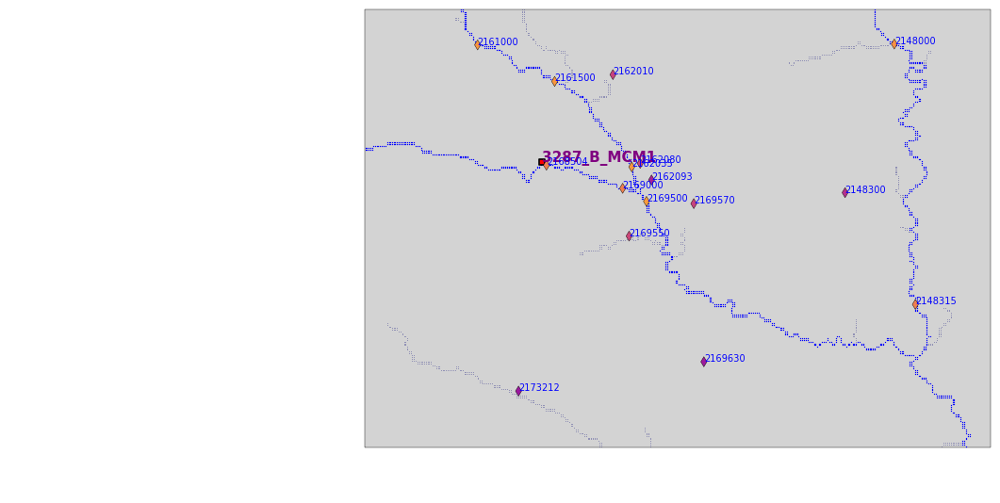

In [116]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


#fig, ax = plt.subplots(figsize=(10,6))
fig = plt.figure(figsize=(12,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-81.5, -80.5, 33.6, 34.3]) # TVA area
    #ax.set_extent([-84.5, -83, 35.5, 36.5]) # TVA area

    #ax.set_extent([-81.5, -80.5, 34.9, 35.3]) # upper appalachia
    #ax.set_extent([-80, -78, 36.2, 36.8]) # upper appalachia
    #ax.set_extent([-87, -85.5, 33.8, 34.3]) # lower appalachia
    #ax.set_extent([-88, -86, 32, 33]) # alabama stations
    #ax.set_extent([-90.5, -89, 36, 37.8]) # alabama stations
    #ax.set_extent([-85.5, -83.5, 36, 37.5]) # lower appalachia

    #ax.set_extent([-81.6, -80.8, 33.5, 34.5]) # upper appalachia
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)

    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.85,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.3,color='blue')
            
    # ======================== Power Lants =====================
    
    for i in range(0,len(power_plant_data3.index)-1   ):
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2', marker='s',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')
        
        ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[i]], 
                        (power_plant_data3.Longitude[power_plant_data3.index[i]], 
                          power_plant_data3.Latitude[power_plant_data3.index[i]]),
                         fontweight='bold', fontsize=11, color='purple', zorder=20)

    # ======================== FLOW =====================
    
    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=30,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    
    for i in  USGS_RBM_flow_min_week.index:
        ax.annotate(USGS_RBM_flow_min_week.site_no[i],
               (lonx[i], latx[i]), color='blue',
                fontsize=7, zorder=20)  # , fontweight='bold'
    
         


    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=11, color='#49F949')

    
    
    plt.show()


if __name__ == '__main__':
    main()

In [55]:
    # ======================== FLOW =====================
    
    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=30,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    
    for i in  USGS_RBM_flow_min_week.index:
        ax.annotate(USGS_RBM_flow_min_week.site_no[i],
               (lonx[i], latx[i]), color='blue',
                fontsize=12, zorder=20)  # , fontweight='bold'
    
         

/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
  if __name__ == '__main__':


array([-76.1635523, -76.1635523, -76.1635523, ..., -76.1863318,
       -76.1635523, -76.1635523])

In [54]:
latx2.columns


Index(['site_no', 'tot_years', 'min_daily_flow_min', 'min_daily_flowp_max',
       'min_daily_flow_mean', 'min_daily_flow_day_min',
       'min_daily_flow_day_max', 'min_daily_flow_day_mean',
       'min_mean_wkly_flow_min', 'min_mean_wkly_flow_max',
       'min_mean_wkly_flow_mean', 'min_mean_wkly_flow_day_min',
       'min_mean_wkly_flow_day_max', 'min_mean_wkly_flow_day_mean'],
      dtype='object')

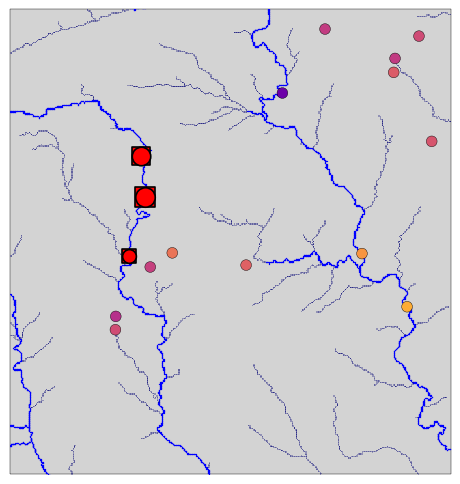

In [155]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


fig, ax = plt.subplots(figsize=(10,6))


def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-87, -82, 34, 37]) # TVA area
    ax.set_extent([-82, -77, 35, 37]) # upper appalachia
    ax.set_extent([-81.5, -79.7, 34.3, 36.2]) # upper appalachia
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    #ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)

    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.85,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.3,color='blue')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=60,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')
    
    
    for i in range(0,len(power_plant_data3.index)-1   ):
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2', marker='s',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')


    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=11, color='#49F949')

    
    
    plt.show()


if __name__ == '__main__':
    main()

In [9]:
power_plant_data3.columns

Index(['Plant Name', 'UniqueID_Final', 'ORIS Plant Code',
       'Boiler/Generator/Committed Unit', 'Unit ID', 'CAMD Database UnitID',
       'PlantType', 'Combustion Turbine/IC Engine', 'Region Name',
       'State Name', 'State Code', 'County', 'County Code', 'FIPS5',
       'Capacity (MW)', 'Heat Rate (Btu/kWh)', 'On Line Year',
       'Retirement Year', 'Firing', 'Bottom', 'Cogen?', 'Modeled Fuels',
       'Wet/DryScrubber', 'Scrubber_Online_Year', 'Scrubber Efficiency',
       'Scrubber Efficiency_MATS', 'NOx Comb Control', 'NOx Post-Comb Control',
       'SCR_Online_Year', 'SNCR_Online_Year', 'PM Control', 'PM Control_MATS',
       'FlueGasConditioning_Flag', 'Mercury_Controls', 'ACI_Online_Year',
       'Mercury_Controls Efficiency_MATS', 'SO2 Permit Rate (lbs/mmBtu)',
       'Mode 1 NOx Rate (lbs/mmBtu)', 'Mode 2 NOx Rate (lbs/mmBtu)',
       'Mode 3 NOx Rate  (lbs/mmBtu)', 'Mode 4 NOx Rate  (lbs/mmBtu)',
       'Hg EMF for BIT_MATS', 'Hg EMF for SUB_MATS', 'Hg EMF for LIG_MATS

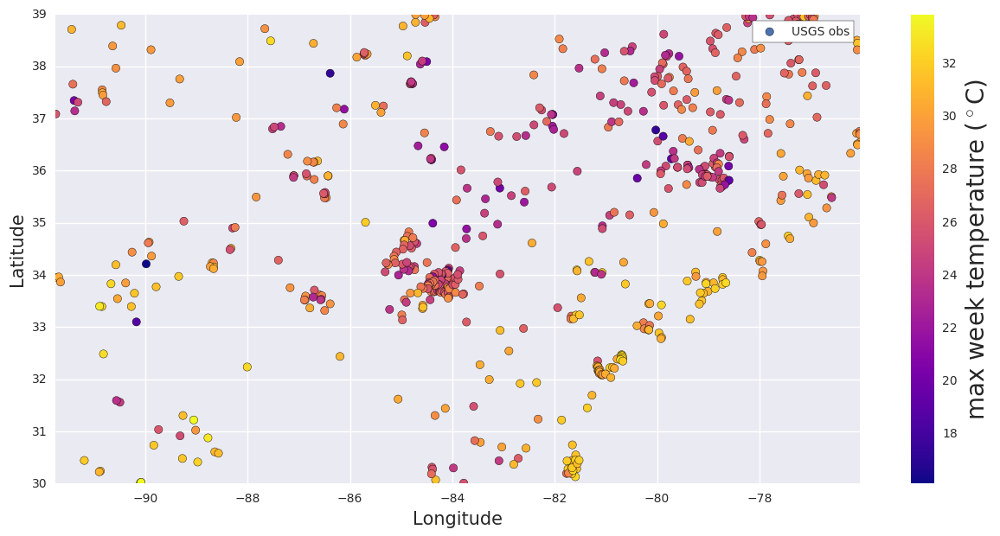

In [9]:


orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap,start=0, midpoint=0.5, stop=1.0)

plt.figure(figsize=[15,7])
plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=45,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')

plt.axis([USGS_RBM_temp_max_week.lon.min(), USGS_RBM_temp_max_week.lon.max(), USGS_RBM_temp_max_week.lat.min(), USGS_RBM_temp_max_week.lat.max()])
plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar()
cbar.ax.set_ylabel('max week temperature ($^\circ$C)', fontsize=20)
#plt.scatter(max_temp.lon,max_temp.lat)



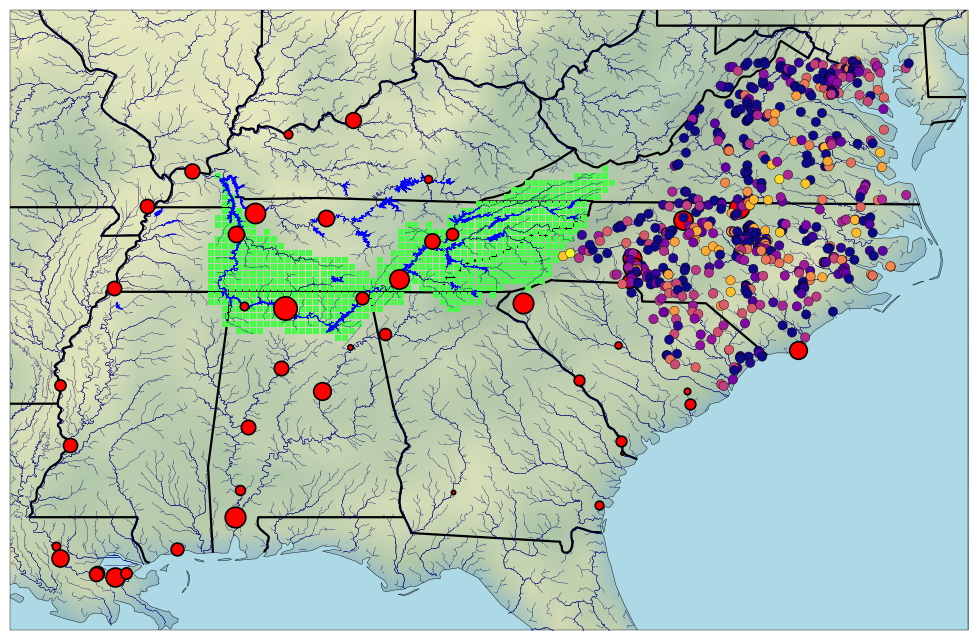

In [55]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=45,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    reader = shpreader.Reader(shpfilename)
    lakes = reader.records()
    for lake in lakes:
        if lake.attributes['AREASQKM'] > 20:
            ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



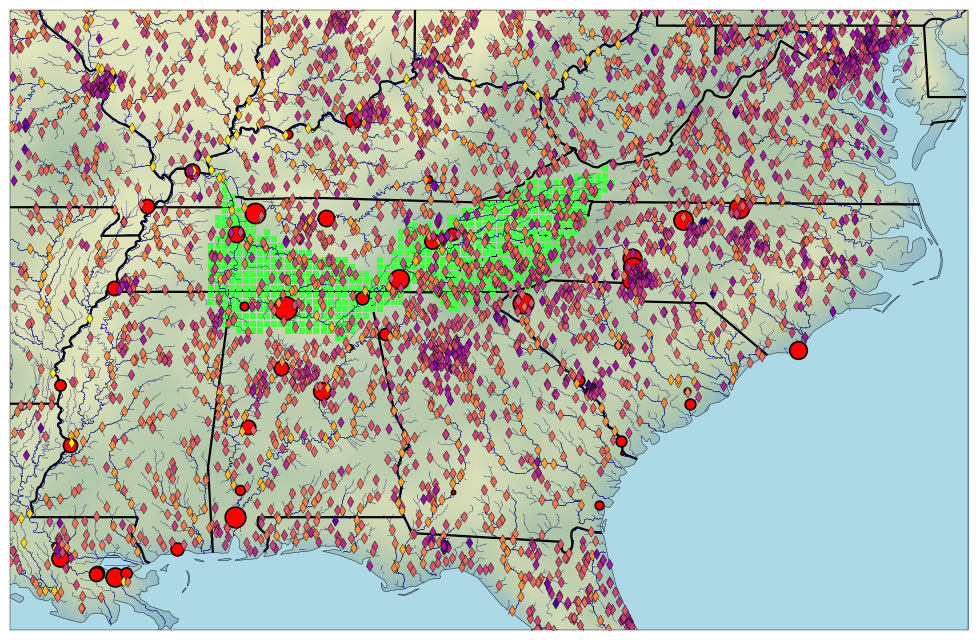

In [169]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=30,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')

    
    plt.show()


if __name__ == '__main__':
    main()



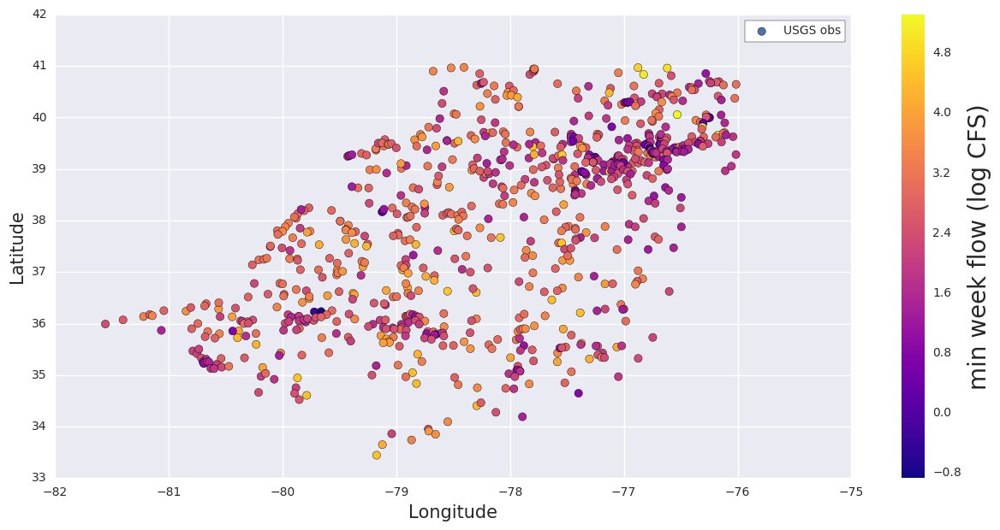

In [67]:

flow_min_log = np.log10(USGS_RBM_flow_min_week.min_mean_wkly_flow_mean)

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap,start=0, midpoint=0.5, stop=1.0)

plt.figure(figsize=[15,7])
plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=45,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs')

#plt.axis([USGS_RBM_flow_min_week.lon.min(), USGS_RBM_flow_min_week.lon.max(), 
#          USGS_RBM_flow_min_week.lat.min(), USGS_RBM_flow_min_week.lat.max()])


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar()
cbar.ax.set_ylabel('min week flow (log CFS)', fontsize=20)
#plt.scatter(max_temp.lon,max_temp.lat)

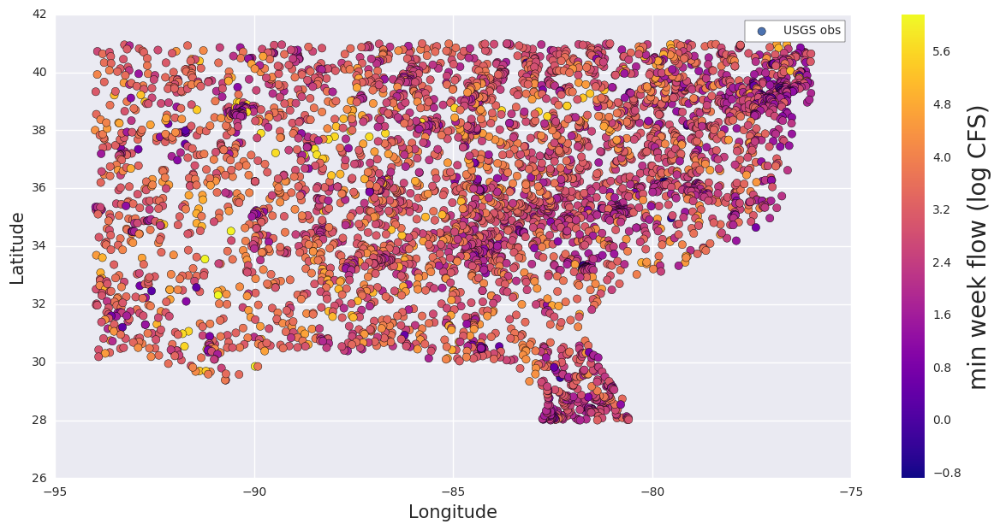

In [168]:

flow_min_log = np.log10(USGS_RBM_flow_min_week.min_mean_wkly_flow_mean)

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap,start=0, midpoint=0.5, stop=1.0)

plt.figure(figsize=[15,7])
plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=45,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs')

#plt.axis([USGS_RBM_flow_min_week.lon.min(), USGS_RBM_flow_min_week.lon.max(), 
#          USGS_RBM_flow_min_week.lat.min(), USGS_RBM_flow_min_week.lat.max()])


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar()
cbar.ax.set_ylabel('min week flow (log CFS)', fontsize=20)
#plt.scatter(max_temp.lon,max_temp.lat)

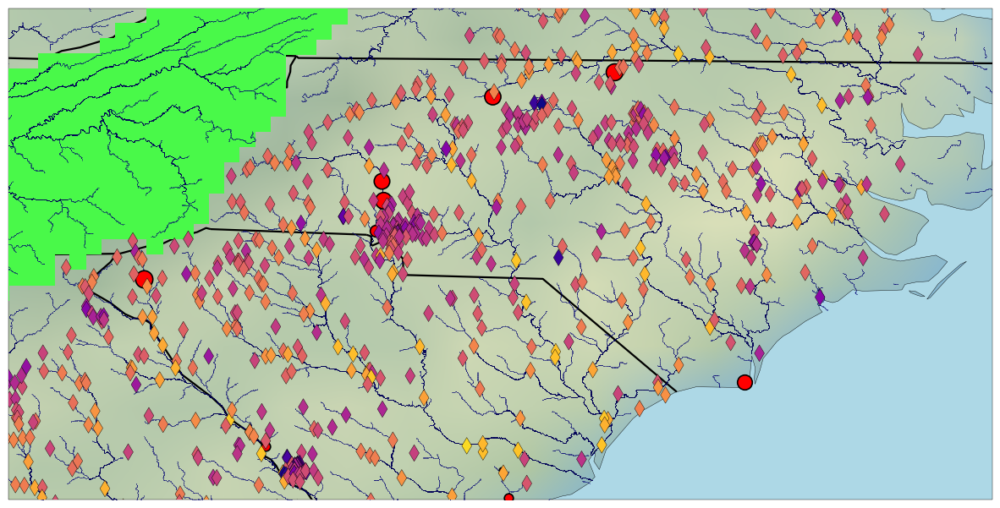

In [94]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area
    ax.set_extent([-84, -76, 33, 37])  # appalachia area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.5,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.3,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=100,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=14, color='#49F949')

    
    plt.show()


if __name__ == '__main__':
    main()



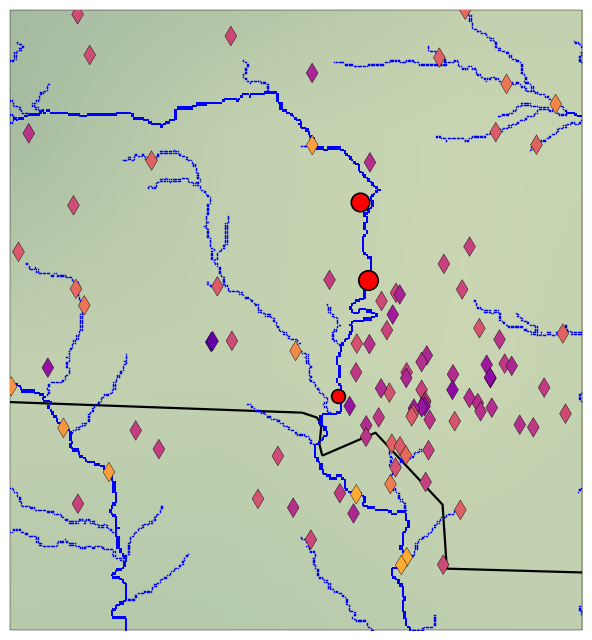

In [101]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    ax.set_extent([-81.7, -80.5, 34.7, 36])  # appalachia area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=1.5,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=100,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=14, color='#49F949')

    
    plt.show()


if __name__ == '__main__':
    main()



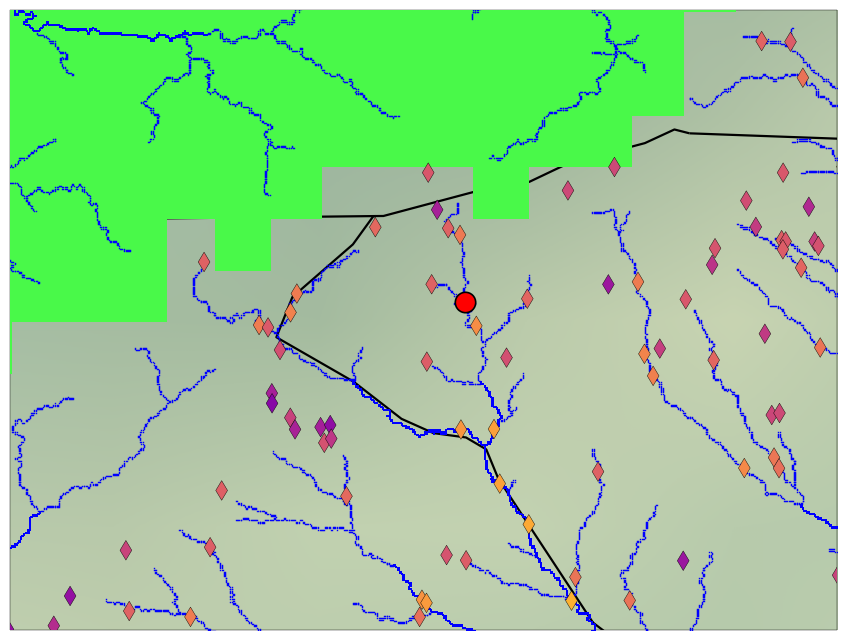

In [108]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-84, -82, 34, 35.5]) # upper TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    #ax.set_extent([-81.7, -80.5, 34.7, 36])  # appalachia area
    

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=1.5,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=100,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=40, color='#49F949')

    
    plt.show()


if __name__ == '__main__':
    main()



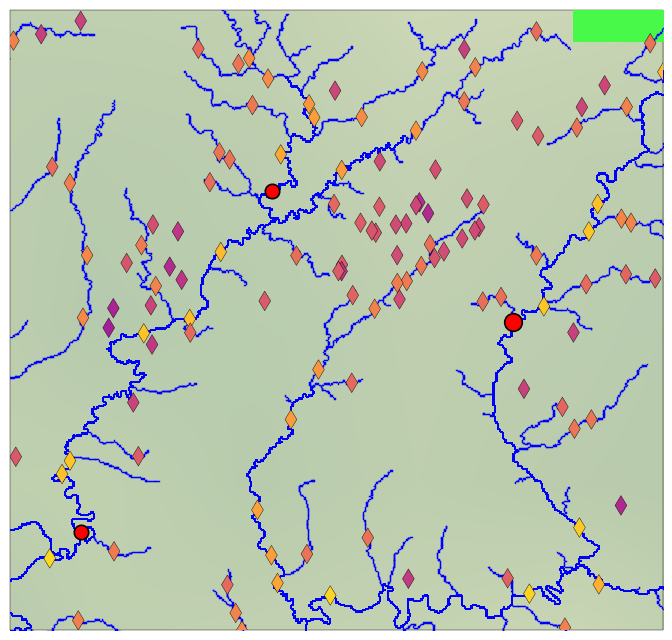

In [129]:

# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-88, -86, 32.3, 34.2]) # upper TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    #ax.set_extent([-81.7, -80.5, 34.7, 36])  # appalachia area
    

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=1.5,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=100,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=40, color='#49F949')

    
    plt.show()


if __name__ == '__main__':
    main()



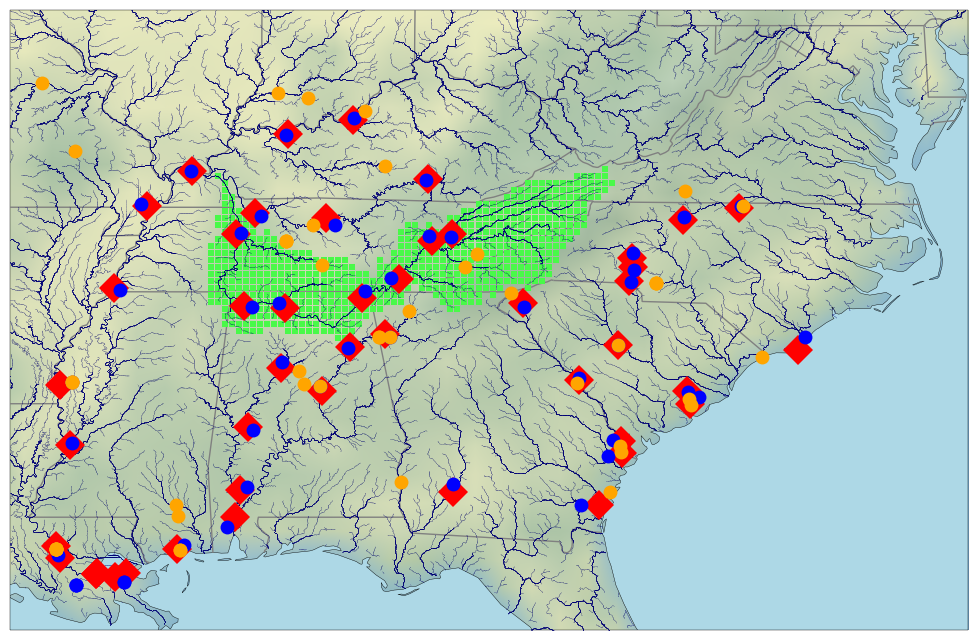

In [33]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    plt.plot(lons_power_oncethrough, lats_power_oncethrough,'s', zorder=15, 
             markersize=15,color='red', marker='D')
    plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
             zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    #for i in range(0,len(power_plant_data3.index)-1   ):
    #    plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],'s', zorder=12, 
    #             markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/200 + 5, color='red', 
    #             transform=ccrs.Geodetic())

    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



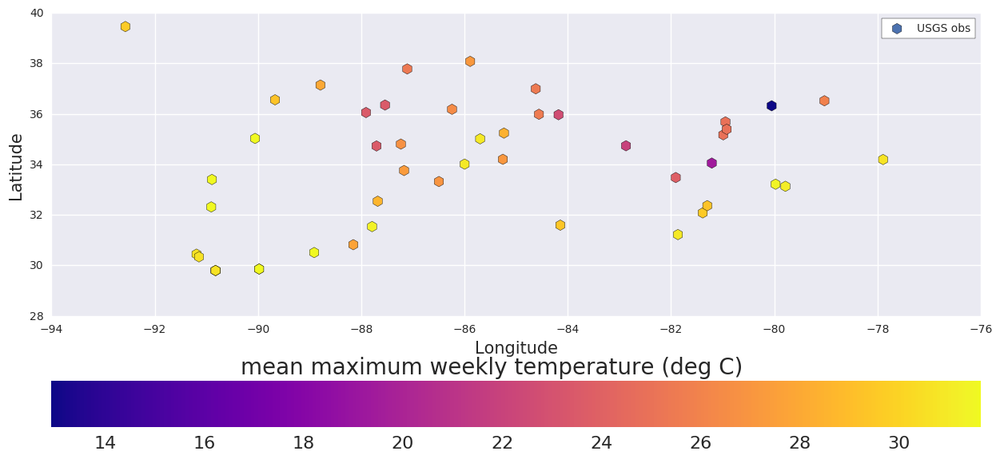

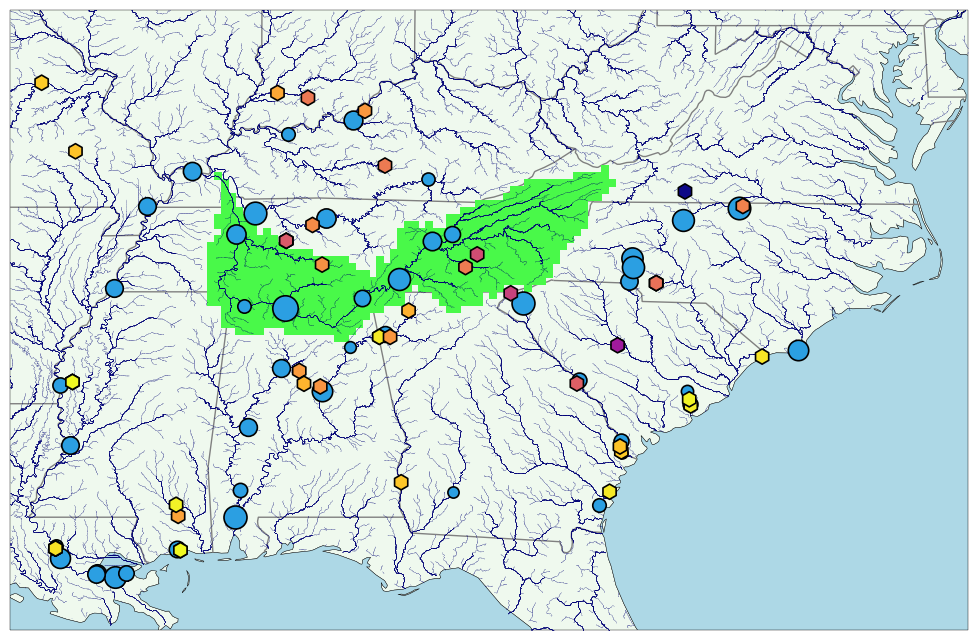

In [119]:
# =============================================================================================================
#
#             SERC area: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_temp, lats_temp, s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



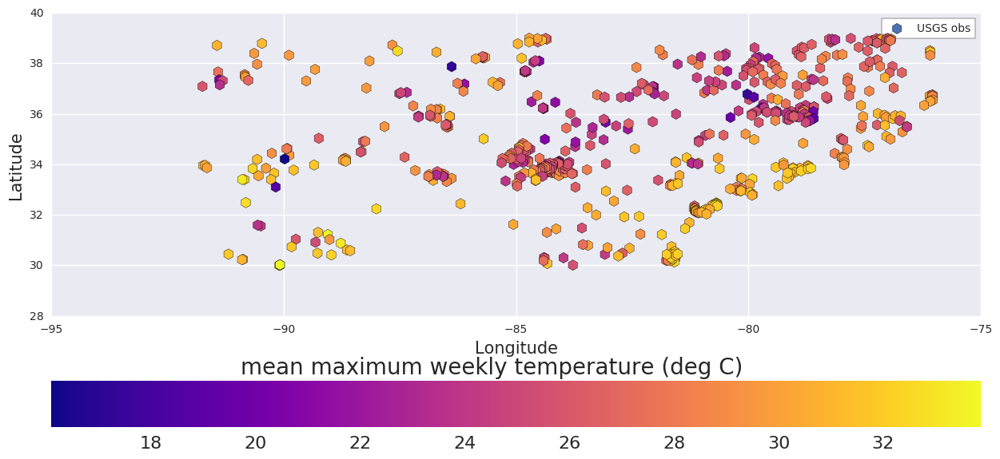

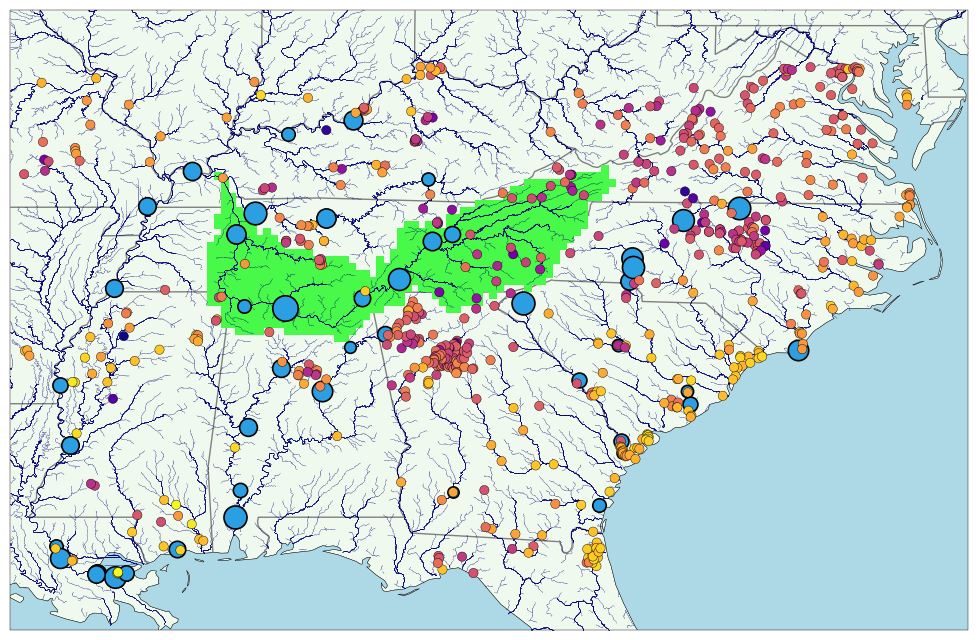

In [142]:
# =============================================================================================================
#
#             SERC area: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat,s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')

plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')

    #plt.scatter(lons_temp, lats_temp, s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
    #            c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')

    
    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=45,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')


    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



In [ ]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=0, midpoint=0.5, stop=1.0)
#shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

#fig = plt.figure(figsize=(15,8))
fig, ax = plt.subplots(figsize=(10,6))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.6)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 2)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, 's', zorder=12, markersize=7, color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')


    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=30,zorder=13,  
                c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs')


    for i in range(0,len(power_plant_data3.index)-1   ):
        #plt.plot(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
        #         's',marker='o', zorder=12, linewidth='3',
        #         markersize=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/100 + 4, color='red', 
        #         transform=ccrs.Geodetic())
        
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=18, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 4, color='red')

        #ax.annotate(power_plant_data3.UniqueID_Final[power_plant_data3.index[i]], 
        #        (power_plant_data3.Longitude[power_plant_data3.index[i]], 
        #          power_plant_data3.Latitude[power_plant_data3.index[i]]),
        #          fontsize=12, color='purple', zorder=20)
    
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=4.5, color='#49F949')
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

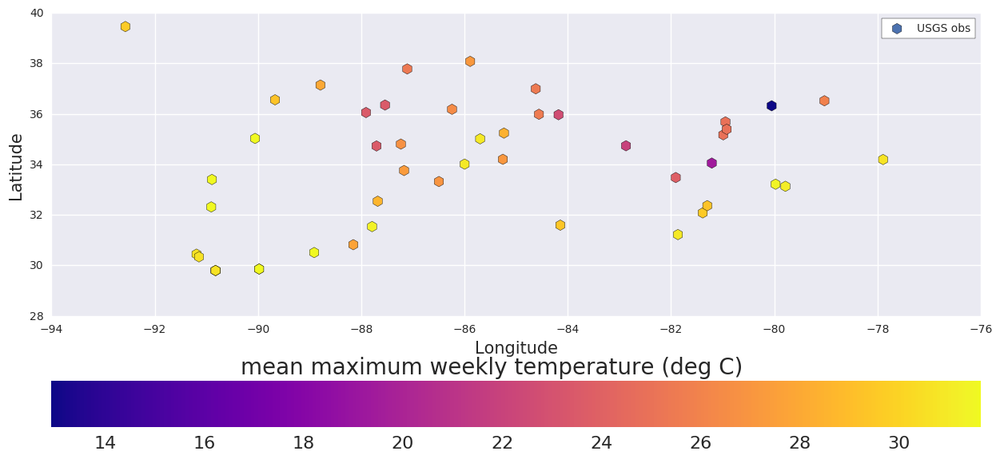

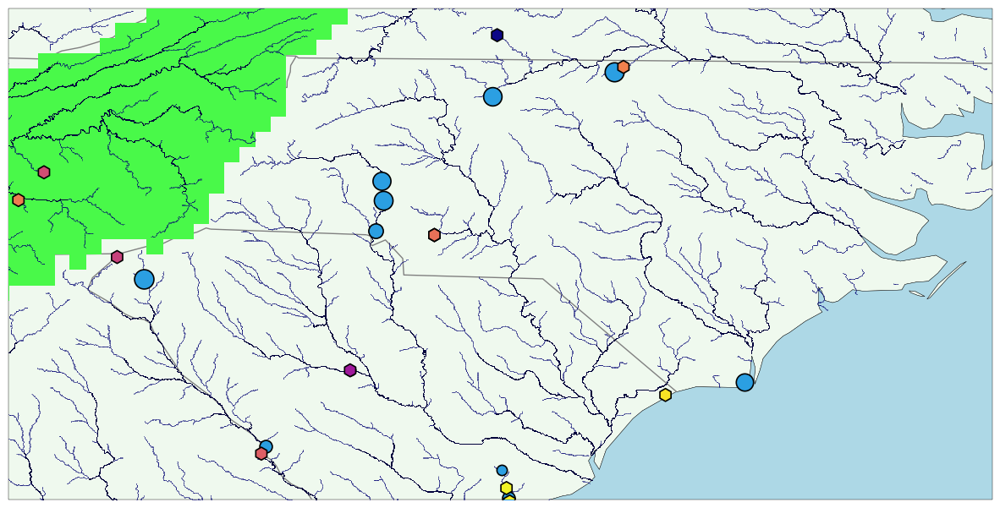

In [160]:
# =============================================================================================================
#
#             SERC area: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    ax.set_extent([-84, -76, 33, 37])  # appalachia area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.3,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.6,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_temp, lats_temp, s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=15, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



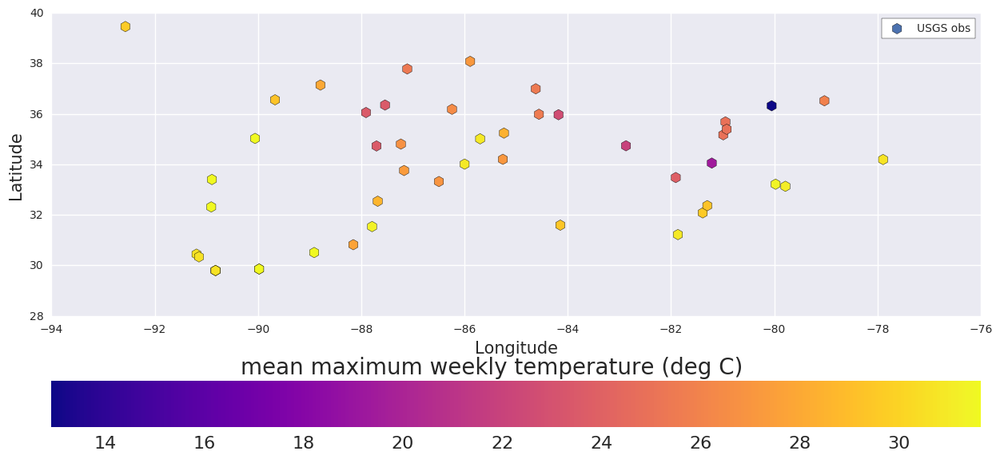

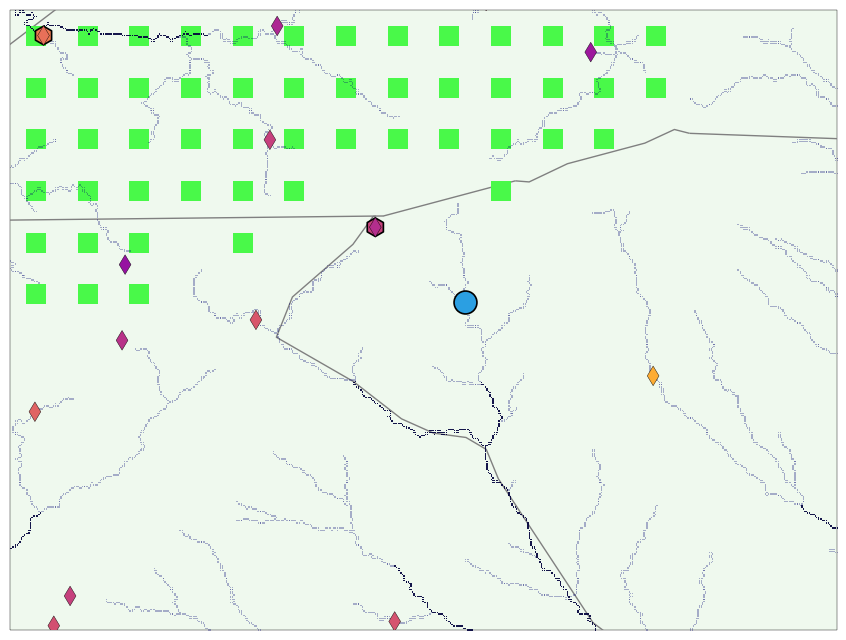

In [114]:
# =============================================================================================================
#
#             upper appalachia/Tennessee: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    #ax.set_extent([-84, -76, 33, 37])  # appalachia area
    ax.set_extent([-84, -82, 34, 35.5]) # upper TVA area


    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.3,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.6,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_temp, lats_temp, s=180,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=USGS_power_temp_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')
    
    plt.scatter(USGS_RBM_temp_max_week.lon, USGS_RBM_temp_max_week.lat, s=100,zorder=13,  marker='d',
            c=USGS_RBM_temp_max_week.temperature, cmap=orig_cmap, label='USGS obs temp')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=15, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



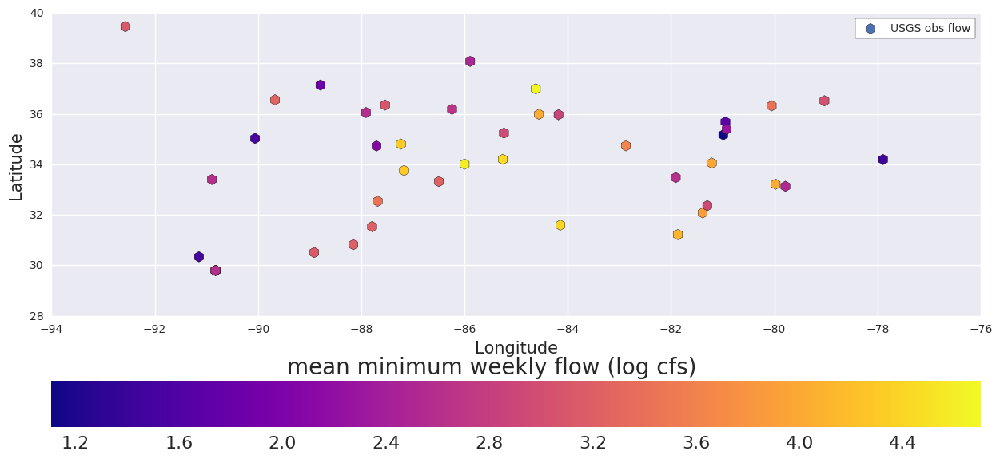

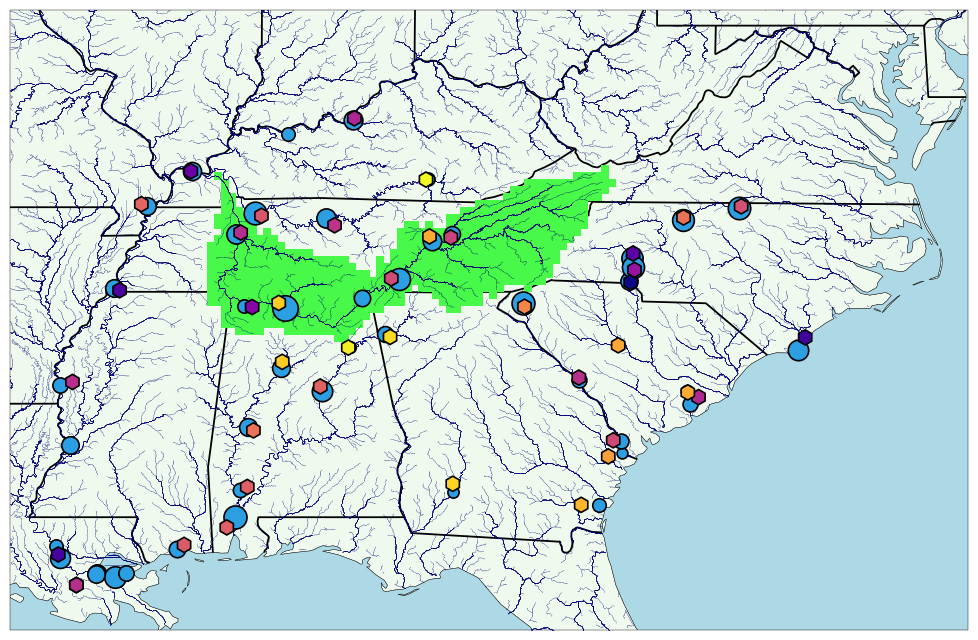

In [166]:
# =============================================================================================================
#
#             SERC area: flow
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=1, midpoint=5, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow[flow_min_log2<5], lats_flow[flow_min_log2<5], s=90,zorder=13, edgecolor='black', marker='h',
                c=flow_min_log2[flow_min_log2<5], cmap=orig_cmap, label='USGS obs flow')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean minimum weekly flow (log cfs) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.3)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_flow[flow_min_log2<5], lats_flow[flow_min_log2<5], s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=flow_min_log2[flow_min_log2<5], cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



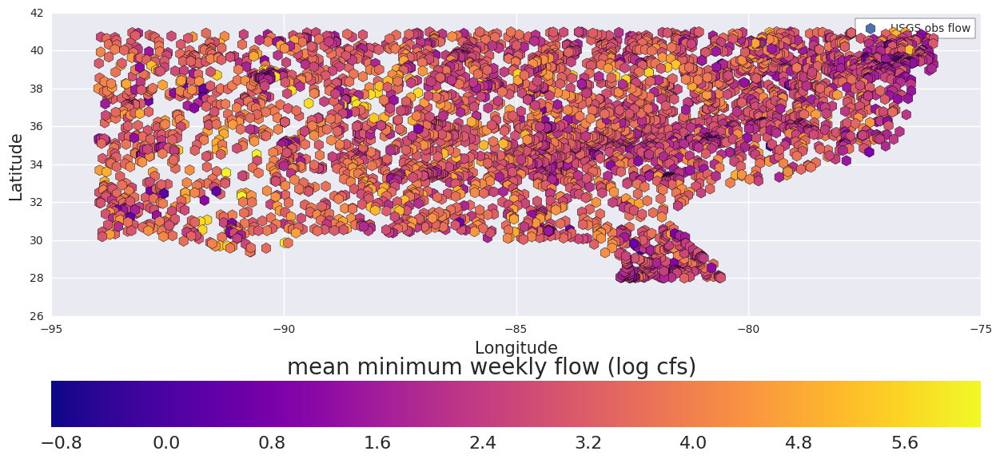

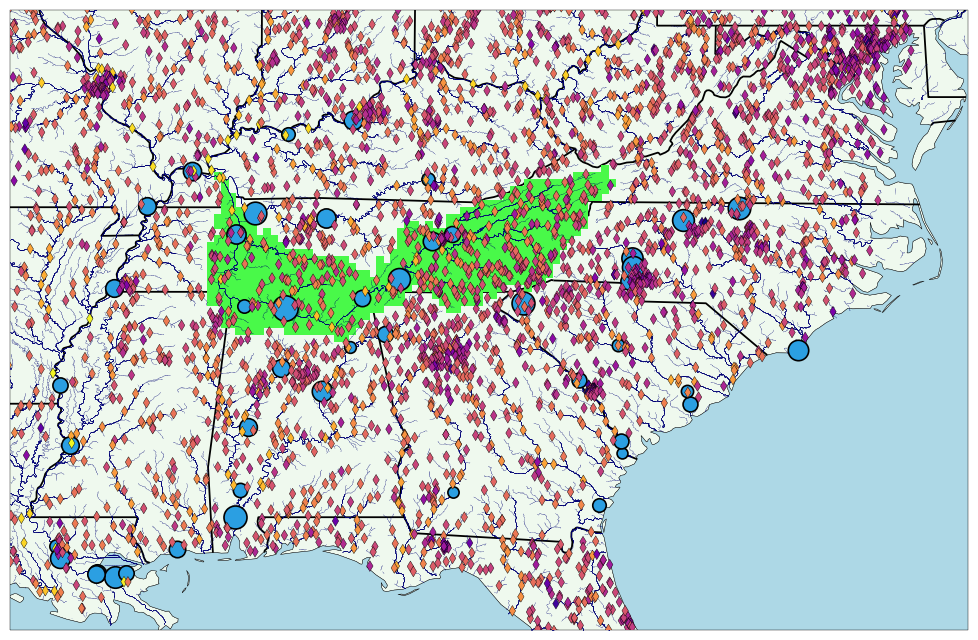

In [143]:
# =============================================================================================================
#
#             SERC area: flow
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=1, midpoint=5, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=90,zorder=13, edgecolor='black', marker='h',
                c=flow_min_log, cmap=orig_cmap, label='USGS obs flow')

plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean minimum weekly flow (log cfs) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.3)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=30,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



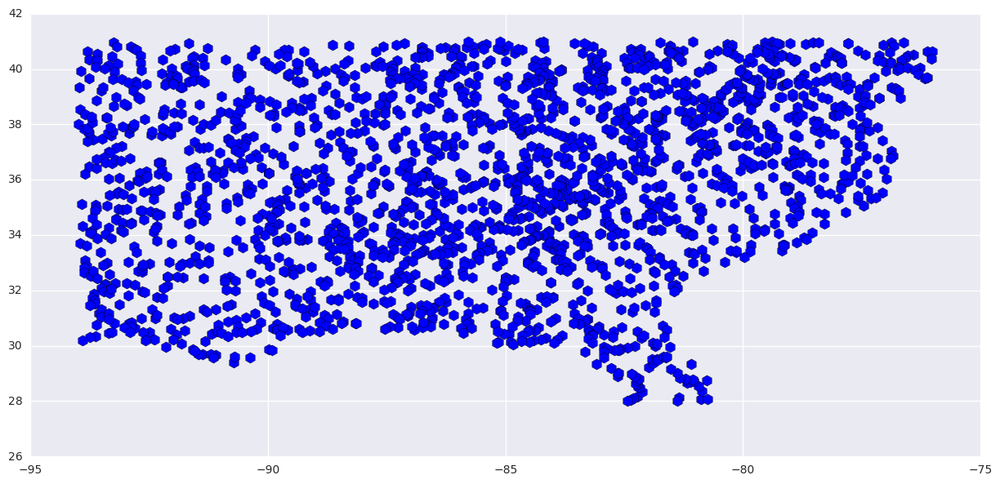

In [160]:
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=1, midpoint=5, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lonx,latx, s=90,zorder=13, edgecolor='black', marker='h',
                  label='USGS obs flow')

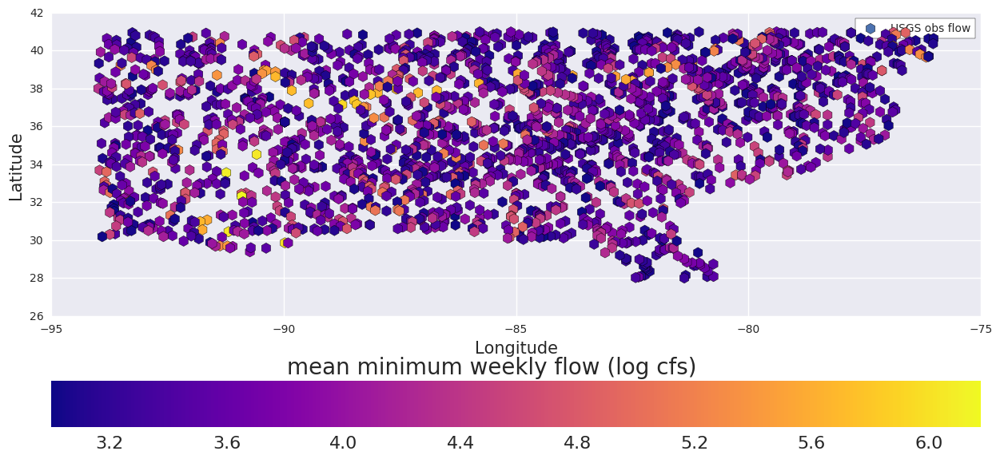

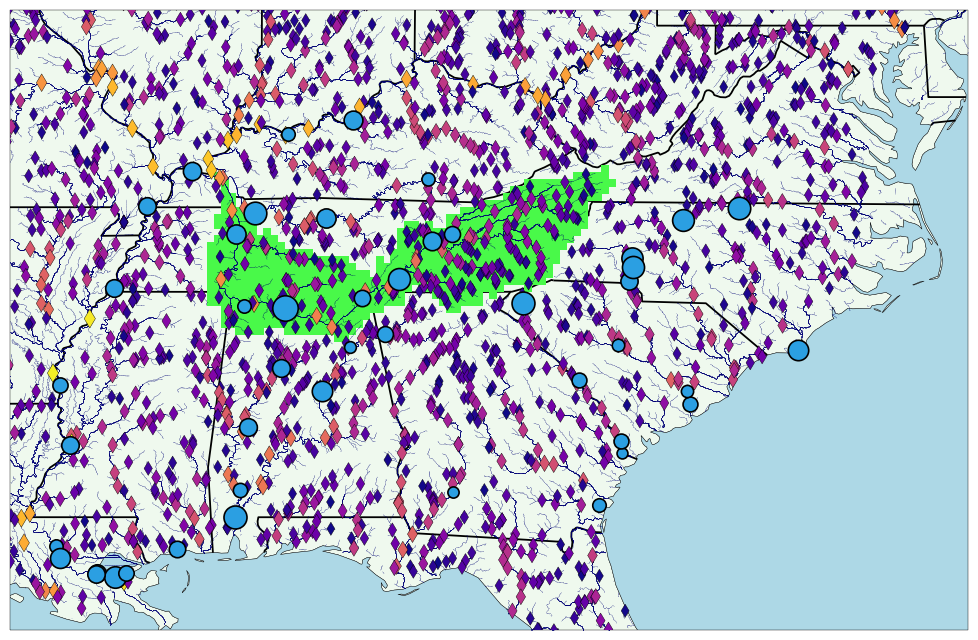

In [165]:
# =============================================================================================================
#
#             SERC area: flow
#
# =============================================================================================================
latx = np.array(USGS_RBM_flow_min_week.lat)
lonx = np.array(USGS_RBM_flow_min_week.lon)
latx = latx[flow_min_log.index[flow_min_log>3] ] 
lonx = lonx[flow_min_log.index[flow_min_log>3] ] 
flow_min_logx = flow_min_log[flow_min_log.index[flow_min_log>3] ] 

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=1, midpoint=5, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lonx,latx, s=90,zorder=13, edgecolor='black', marker='h',
                c=flow_min_logx, cmap=orig_cmap, label='USGS obs flow')

plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean minimum weekly flow (log cfs) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.3)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lonx, latx, s=flow_min_logx*15,zorder=13,  
                c=flow_min_logx, cmap=orig_cmap, label='USGS obs',  marker='d')
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=15, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



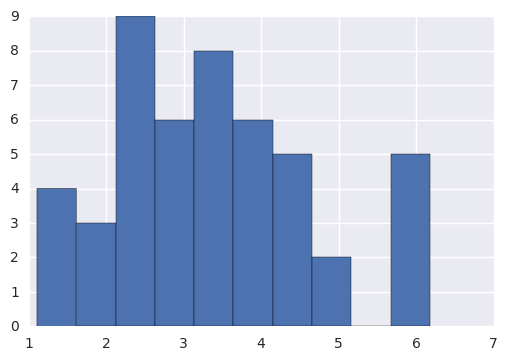

In [164]:
flow_min_log2.hist()

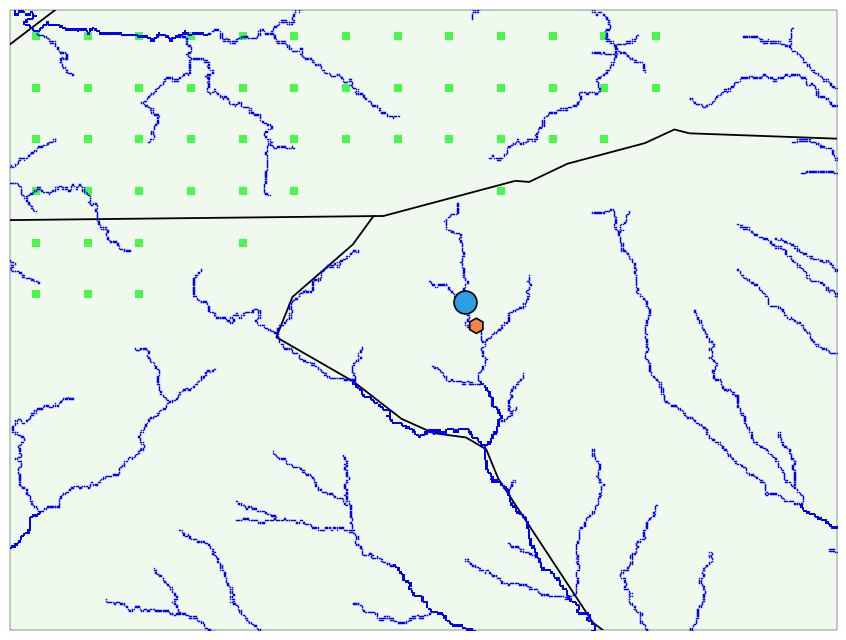

In [110]:

# =============================================================================================================
#
#             SERC area: flow
#
# =============================================================================================================


fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    ax.set_extent([-84, -82, 34, 35.5]) # upper TVA area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.3)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=1.5,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_flow[flow_min_log2<5], lats_flow[flow_min_log2<5], s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=flow_min_log2[flow_min_log2<5], cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



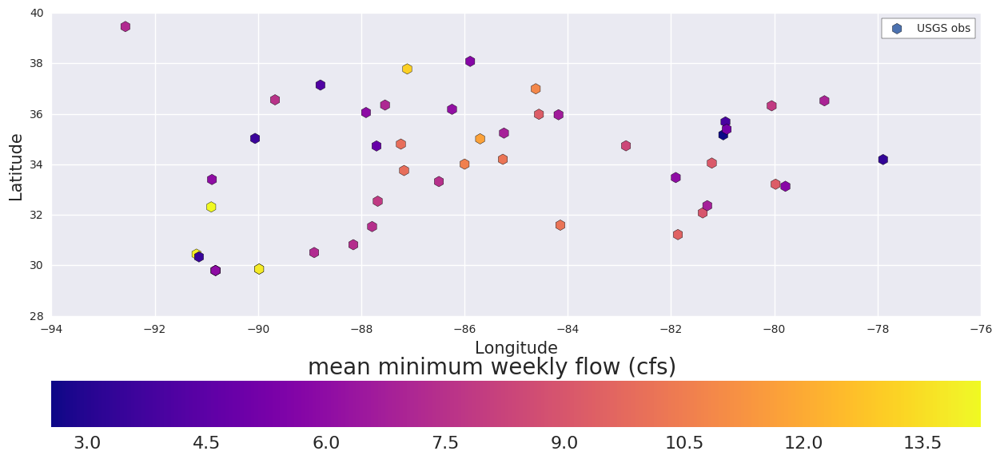

In [150]:
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=flow_min_log2, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean minimum weekly flow (cfs) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

In [14]:
USGS_power_flow_stats.columns

Index(['Unnamed: 0', 'site_no', 'tot_years', 'min_daily_flow_min',
       'min_daily_flowp_max', 'min_daily_flow_mean', 'min_daily_flow_day_min',
       'min_daily_flow_day_max', 'min_daily_flow_day_mean',
       'min_mean_wkly_flow_min', 'min_mean_wkly_flow_max',
       'min_mean_wkly_flow_mean', 'min_mean_wkly_flow_day_min',
       'min_mean_wkly_flow_day_max', 'min_mean_wkly_flow_day_mean'],
      dtype='object')

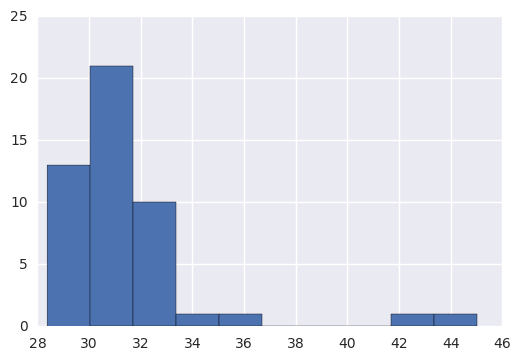

In [11]:
USGS_power_temp_stats.max_mean_wkly_temp_day_mean.hist()

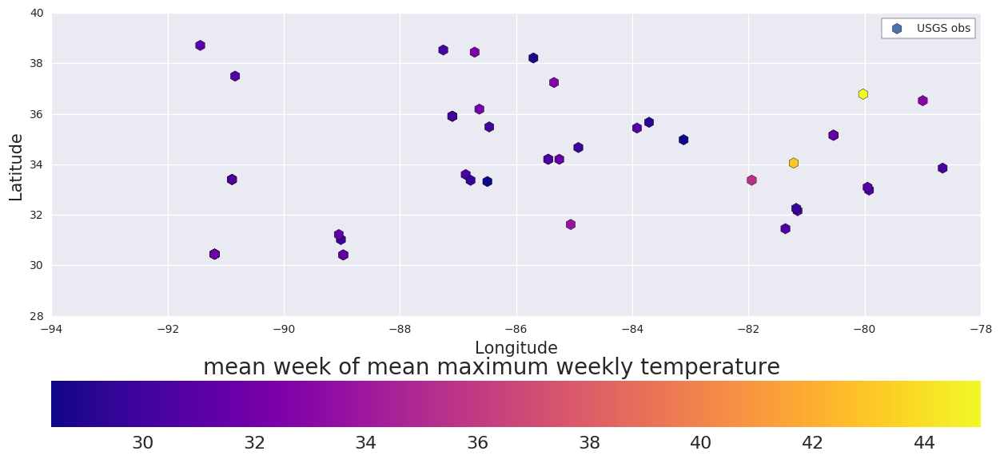

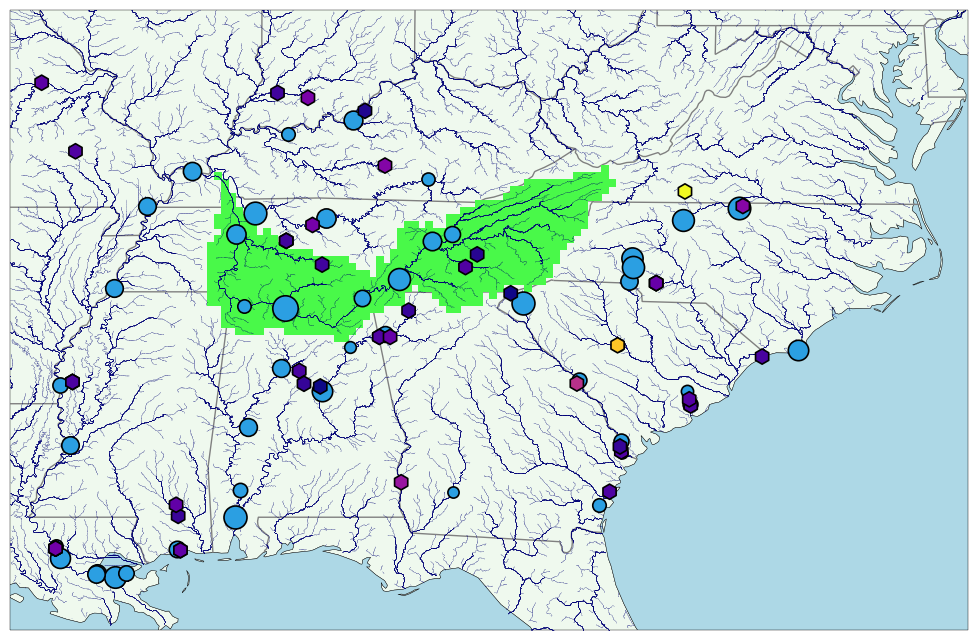

In [13]:
# =============================================================================================================
#
#             SERC area: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_temp, lats_temp, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_temp_stats.max_mean_wkly_temp_day_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean week of mean maximum weekly temperature \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_temp, lats_temp, s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=USGS_power_temp_stats.max_mean_wkly_temp_day_mean, cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



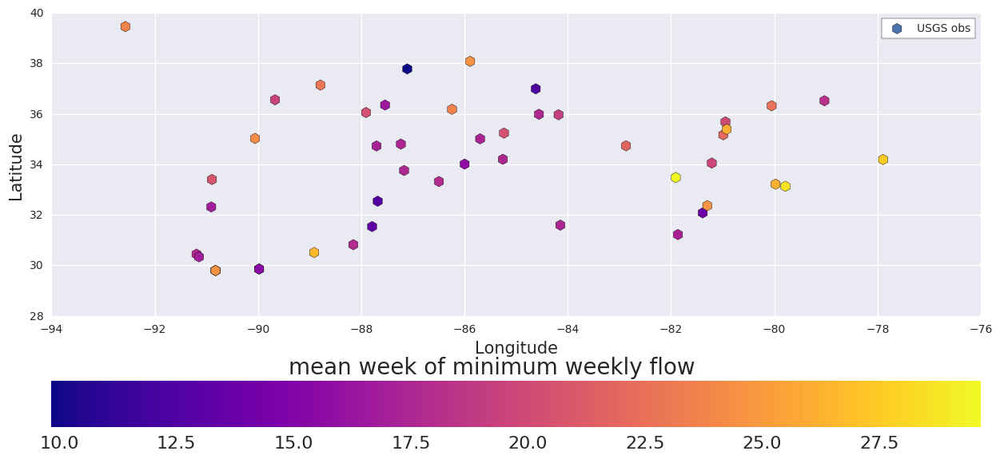

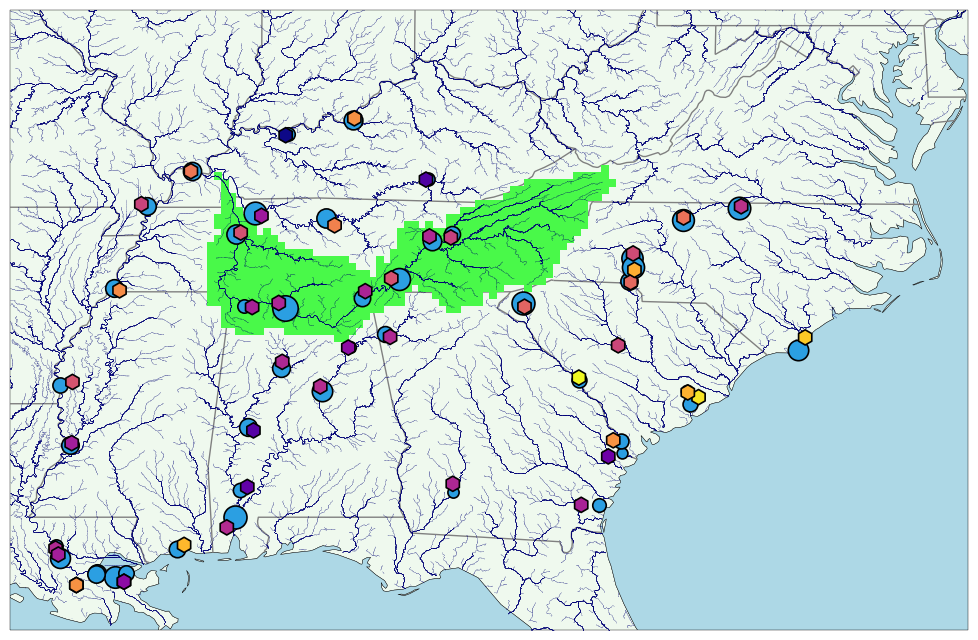

In [15]:
# =============================================================================================================
#
#             SERC area: minimum temperature
#
# =============================================================================================================

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_flow_stats.min_mean_wkly_flow_day_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean week of minimum weekly flow \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_flow, lats_flow, s=120,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=USGS_power_flow_stats.min_mean_wkly_flow_day_mean, cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



In [ ]:
    plt.scatter(USGS_RBM_flow_min_week.lon, USGS_RBM_flow_min_week.lat, s=30,zorder=13,  
                c=flow_min_log, cmap=orig_cmap, label='USGS obs',  marker='d')

In [21]:
xlist = USGS_RBM_flow_min_week.site_no

In [25]:
type(plant_usgs_list.USGS_flow[1])

str

In [44]:
USGS_RBM_flow_min_week.lat

AttributeError: 'DataFrame' object has no attribute 'lat'

In [94]:
latx = np.array(USGS_RBM_flow_min_week.lat)
lonx = np.array(USGS_RBM_flow_min_week.lon)
usgs_flow_sites = pd.DataFrame()
usgs_flow_sites_lat = pd.DataFrame()
usgs_flow_sites_lon = pd.DataFrame()

for i in plant_usgs_list.USGS_flow:
    i = str(i)
    if(i == 'nan'):
        #print(i)
        i = str(i)
    else:
        i = int(i)
        #print(i)
        #print(latx[USGS_RBM_flow_min_week.site_no == i])
        xi = USGS_RBM_flow_min_week[USGS_RBM_flow_min_week.site_no == i]
        xi = pd.DataFrame(xi)
        #xi = xi.transpose()
        usgs_flow_sites = usgs_flow_sites.append(xi)
        indexx = USGS_RBM_flow_min_week.index[USGS_RBM_flow_min_week.site_no == i]
        latxi = pd.DataFrame([latx[indexx]])
        usgs_flow_sites_lat = usgs_flow_sites_lat.append(latxi)
        
        lonxi = pd.DataFrame([lonx[indexx]])
        usgs_flow_sites_lon = usgs_flow_sites_lon.append(lonxi)


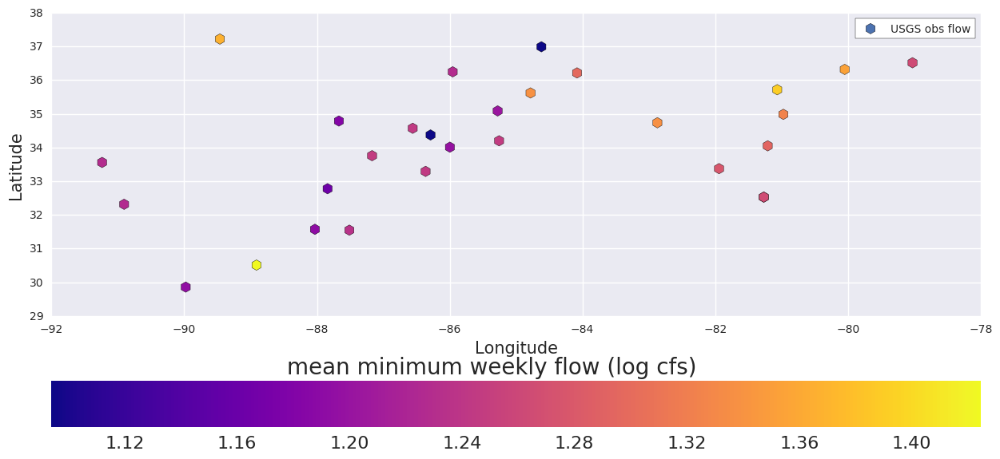

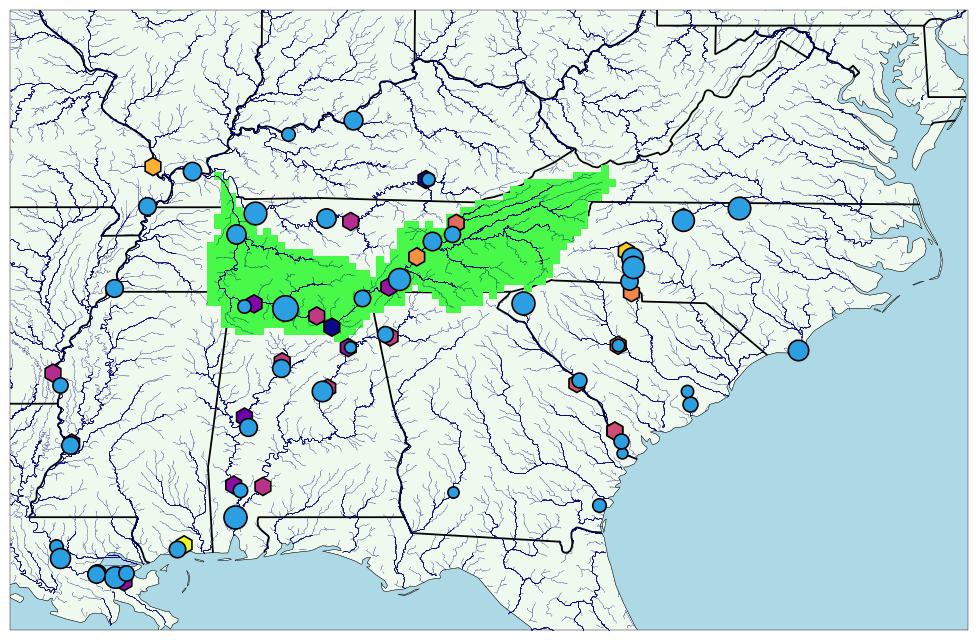

In [98]:
# =============================================================================================================
#
#             SERC area: flow
#
# =============================================================================================================
log_flow_x = np.log10(usgs_flow_sites.min_mean_wkly_flow_day_mean)

orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=1, midpoint=5, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(usgs_flow_sites_lon,usgs_flow_sites_lat, s=90,zorder=13, edgecolor='black', marker='h',
                c=log_flow_x, cmap=orig_cmap, label='USGS obs flow')

plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean minimum weekly flow (log cfs) \n', fontsize=20,rotation=360, labelpad=-400)
cbar.ax.tick_params(labelsize=16)
plt.show()

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='#EFF9EE', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='black', zorder = 3, linewidth = 1.3)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(usgs_flow_sites_lon, usgs_flow_sites_lat, s=170,zorder=13, edgecolor='black', marker='h', linewidth='1.2',
                c=log_flow_x, cmap=orig_cmap, label='USGS obs')
    
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=15, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 60, color='#2B9FE2')

    #2B9FE2 22C2F3
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()



In [85]:
usgs_flow_sites_lon

,0
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552
0,-76.163552


In [144]:
len(lons_flow)

48

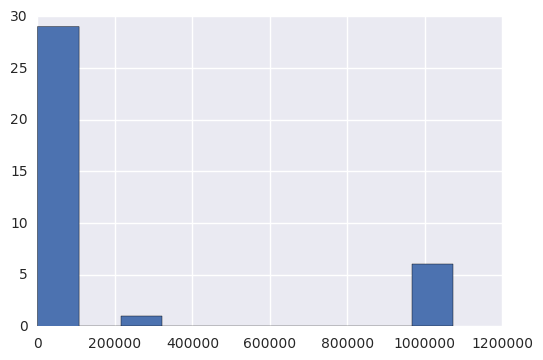

In [128]:
USGS_power_temp_stats.max_mean_wkly_temp_mean

0     27.720000
1     30.995792
2     27.287831
3     28.602806
4     26.969643
5     26.751565
6     23.569048
7     30.995792
8     31.290476
9     27.085444
10    30.989301
11    29.457143
12    29.604902
13    27.186508
14    25.374745
15    27.949780
16    25.463492
17    30.642857
18    30.642857
19    30.642857
20    30.642857
21    31.595238
22    31.595238
23    31.656327
24    29.303571
25    29.645714
26    25.904348
27    24.980000
28    24.980000
29    21.935714
30    19.415357
31    23.835119
32    31.137812
33    31.378242
34    31.656327
35    22.716071
36    23.569048
37    26.387912
38    23.569048
39    25.546218
40    30.642857
41    30.737222
42    24.980000
43    29.257143
44    28.364413
45    12.912245
46    31.656327
47    30.642857
Name: max_mean_wkly_temp_mean, dtype: float64

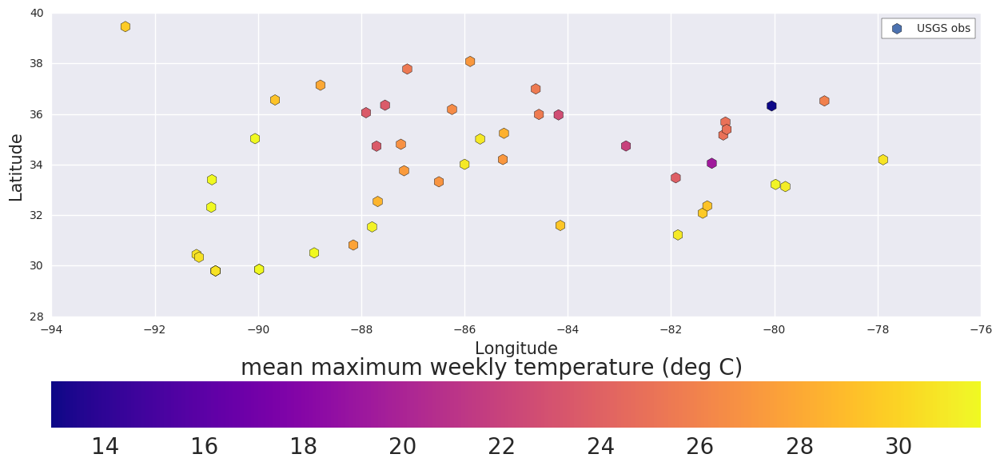

In [110]:
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar(orientation='horizontal')
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C) \n', fontsize=20,rotation=360, labelpad=-400)
bar.ax.tick_params(labelsize=16)
plt.show()
#plt.scatter(max_temp.lon,max_temp.lat)

In [ ]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================
orig_cmap = plt.get_cmap("plasma")
shifted_cmap = shiftedColorMap(orig_cmap, start=20, midpoint=34, stop=1, name='shifted')

fig = plt.figure(figsize=(15,8))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    
    
    #plt.plot(USGS_power_summary.lon_temp, USGS_power_summary.lat_temp,'s',
    #         zorder=16, markersize=10,color='orange', marker='o')
    #plt.plot(lons_flow, lats_flow,'s', zorder=16, markersize=10,color='blue', marker='o')
    plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_stats., cmap=orig_cmap, label='USGS obs')

    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=6, color='#49F949')
    #plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_powerY, lats_powerY,'s', zorder=12, markersize=marker_size_heat[1], color='orange', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    for i in range(0,len(power_plant_data3.index)-1   ):
        plt.scatter(power_plant_data3.Longitude[power_plant_data3.index[i]], power_plant_data3.Latitude[power_plant_data3.index[i]],
         edgecolor='black', zorder=12, linewidth='1.2',
         s=power_plant_data3['Capacity (MW)'][power_plant_data3.index[i]]/12 + 30, color='red')

    
    
    #shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    #reader = shpreader.Reader(shpfilename)
    #lakes = reader.records()
    #for lake in lakes:
    #    if lake.attributes['AREASQKM'] > 20:
    #        ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()


plt.figure(figsize=[15,7])
plt.scatter(lons_flow, lats_flow, s=90,zorder=13, edgecolor='black', marker='h',
                c=USGS_power_stats.max_mean_wkly_temp_mean, cmap=orig_cmap, label='USGS obs')


plt.ylabel('Latitude', fontsize=15)
plt.xlabel('Longitude', fontsize=15)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('black')
    
cbar = plt.colorbar()
cbar.ax.set_ylabel('mean maximum weekly temperature (deg C)', fontsize=20)
plt.show()
#plt.scatter(max_temp.lon,max_temp.lat)

In [73]:
USGS_power_stats.head()

,Unnamed: 0,site_no,tot_years,max_daily_temp_min,max_daily_temp_max,max_daily_temp_mean,max_daily_temp_day_min,max_daily_temp_day_max,max_daily_temp_day_mean,max_mean_wkly_temp_min,max_mean_wkly_temp_max,max_mean_wkly_temp_mean,max_mean_wkly_temp_day_min,max_mean_wkly_temp_day_max,max_mean_wkly_temp_day_mean
0,0,2479155,5,26.1,30.1,28.420000,180.0,209.0,193.200000,25.528571,29.557143,27.720000,26.0,34.0,29.800000
1,0,2397530,37,27.5,35.4,31.608108,157.0,252.0,210.378378,27.028571,35.350000,30.995792,23.0,37.0,30.675676
2,0,2457595,27,26.4,30.2,28.048148,176.0,235.0,206.222222,25.600000,29.342857,27.287831,26.0,35.0,30.370370
3,0,2423496,28,27.4,31.8,29.421429,159.0,238.0,201.178571,26.285714,30.585714,28.602806,25.0,35.0,29.607143
4,0,2407514,8,25.1,29.1,27.812500,179.0,224.0,199.125000,24.285714,28.600000,26.969643,26.0,31.0,28.375000


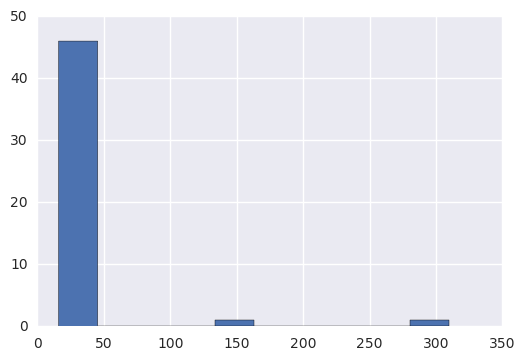

In [64]:
USGS_power_stats.max_daily_temp_max.hist()


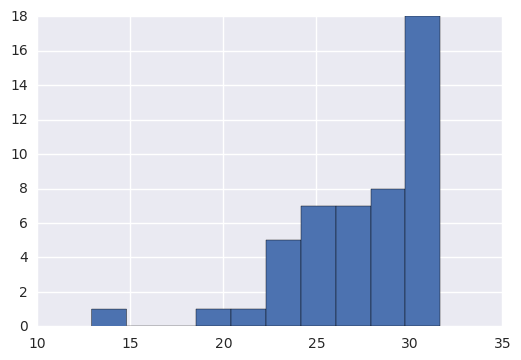

In [65]:
USGS_power_stats.max_mean_wkly_temp_mean.hist()

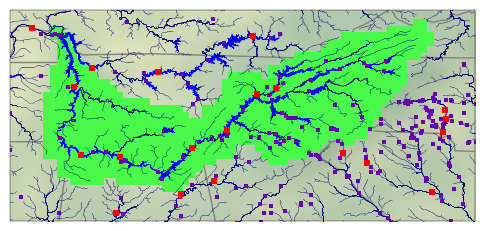

In [7]:

# =============================================================================================================
#
#             Tennessee Valley Map
#
# =============================================================================================================

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-89.2, -80.4, 33.5, 37.5])  # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',zorder=6, markersize=0.12,color='blue')
    plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    plt.plot(lons_power, lats_power,'s', zorder=8, markersize=5,color='red', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=10,color='#49F949')
    
    shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    reader = shpreader.Reader(shpfilename)
    lakes = reader.records()
    for lake in lakes:
        if lake.attributes['AREASQKM'] > 20:
            ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

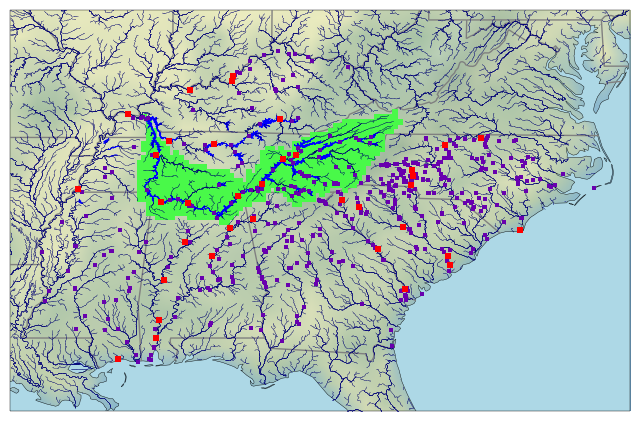

In [44]:
# =============================================================================================================
#
#             SERC area
#
# =============================================================================================================

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.17,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6, markersize=0.1,color='blue')
    plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    plt.plot(lons_power, lats_power,'s', zorder=8, markersize=5,color='red', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=3.8,color='#49F949')
    
    shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    reader = shpreader.Reader(shpfilename)
    lakes = reader.records()
    for lake in lakes:
        if lake.attributes['AREASQKM'] > 20:
            ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

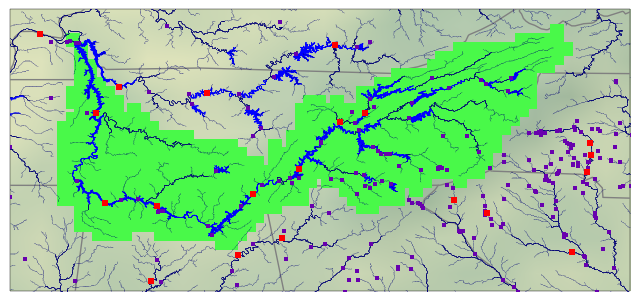

In [49]:
# =============================================================================================================
#
#             Tennessee Valley Map
#
# =============================================================================================================

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-89.2, -80.4, 33.5, 37.5])  # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5, markersize=0.26,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',zorder=6, markersize=0.12,color='blue')
    plt.plot(lons_power3, lats_power3,'s', zorder=7, markersize=3,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    plt.plot(lons_power, lats_power,'s', zorder=8, markersize=5,color='red', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    plt.plot(lons_network, lats_network,'s',zorder=4, markersize=10,color='#49F949')
    
    shpfilename = '/raid3/rniemeyr/RBM/data/mapping_data/shapefiles/NHD_Tennessee/NHDWaterbody'
    reader = shpreader.Reader(shpfilename)
    lakes = reader.records()
    for lake in lakes:
        if lake.attributes['AREASQKM'] > 20:
            ax.add_geometries(lake.geometry,  ccrs.PlateCarree(), color='blue', zorder=5)
    
    
    plt.show()


if __name__ == '__main__':
    main()

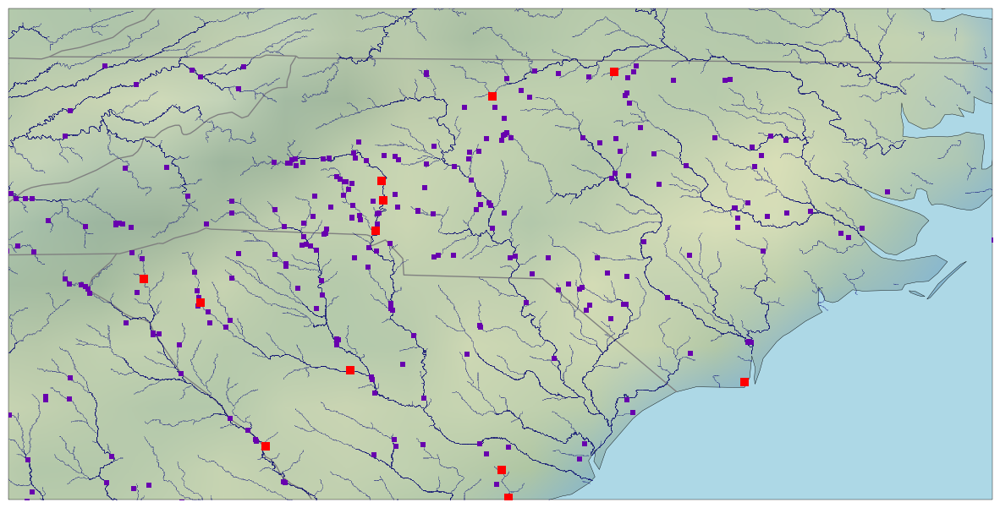

In [55]:
# =============================================================================================================
#
#             Appalachia area
#
# =============================================================================================================
fig = plt.figure(figsize=(15, 20))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    #ax.set_extent([-92, -75, 29, 40])  # SERC area
    ax.set_extent([-84, -76, 33, 37])  # SERC area

    # Put a background image on for nice sea rendering.
    ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='gray', zorder = 3, linewidth = 1)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5,  markersize=0.35,color='blue')
    plt.plot(lons_river_med, lats_river_med,'s',  zorder=6,  markersize=0.2,color='blue')
    plt.plot(lons_power3, lats_power3,'s', zorder=7,  markersize=5,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    plt.plot(lons_power, lats_power,'s', zorder=8,  markersize=7,color='red', transform=ccrs.Geodetic(), label='power plants (w/pass through)')
    #plt.plot(lons_network, lats_network,'s',zorder=4, markersize=3.8,color='#49F949')
    

    plt.show()


if __name__ == '__main__':
    main()

/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:65: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


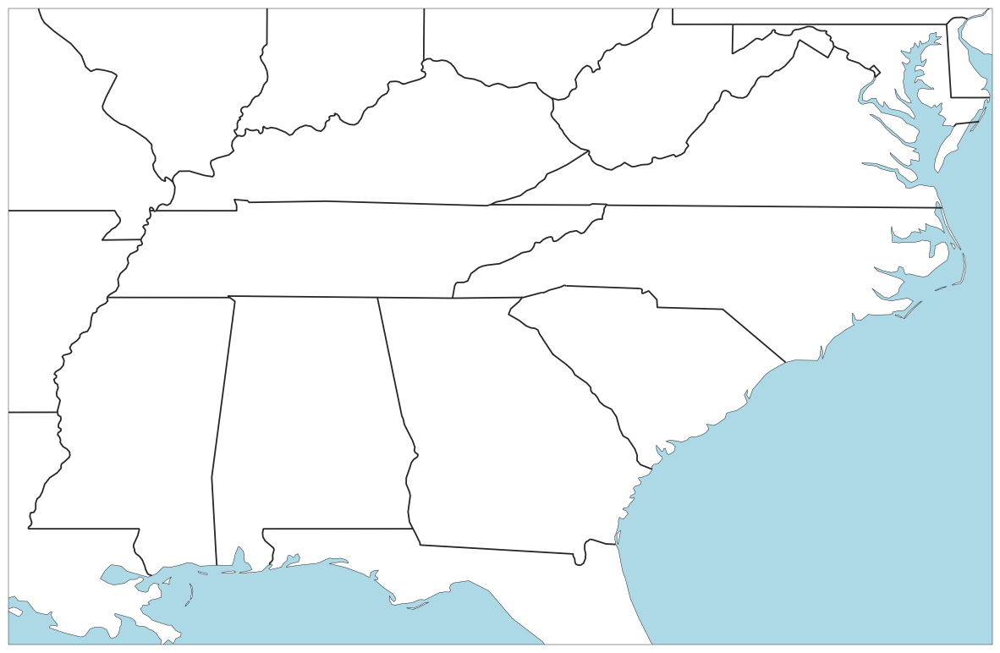

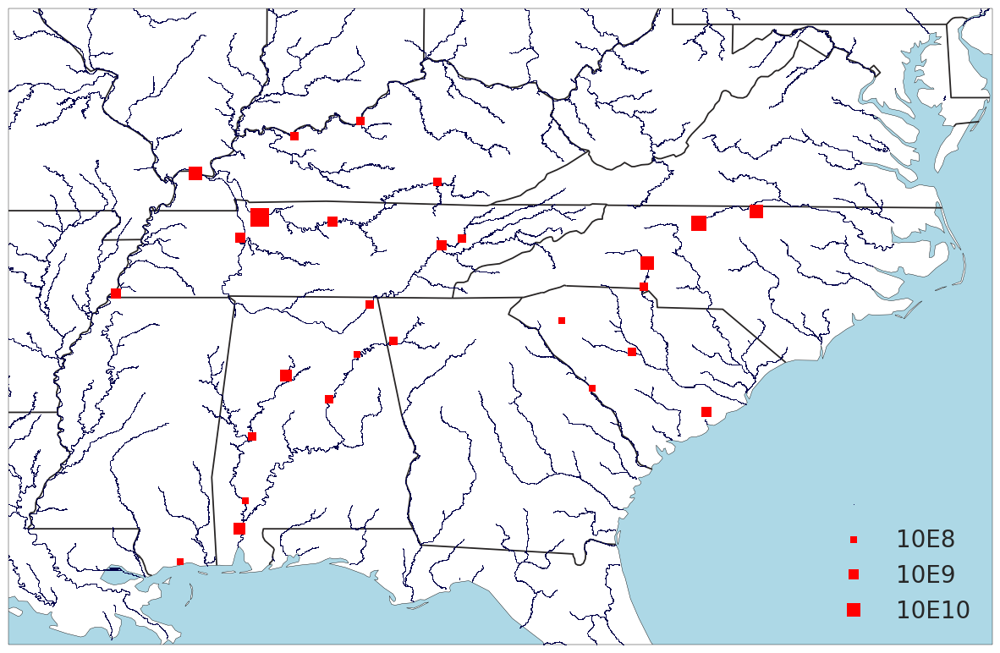

In [167]:
# =============================================================================================================
#
#            SERC arae with max discharge
#
# =============================================================================================================

import matplotlib.patches as mpatches

fig = plt.figure(figsize=(15, 20))

def main():
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-90, -80, 34, 38]) # TVA area
    ax.set_extent([-92, -75, 29, 40])  # SERC area
    #ax.set_extent([-84, -76, 33, 37])  # SERC area

    # Put a background image on for nice sea rendering.
    #ax.stock_img()

    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
    
    rivers_lakes = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='50m',
        facecolor='none')
    
    country_borders = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_0_boundary_lines_land',
        scale='50m',
        facecolor='none')

    land = cfeature.NaturalEarthFeature(
        category='physical',
        name='land',
        scale='50m',
        facecolor='gray')

    ocean = cfeature.NaturalEarthFeature(
        category='physical',
        name='ocean',
        scale='50m',
        facecolor='blue')
        
    #ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    #ax.add_feature(land,facecolor='lightgray', zorder = 0)
    ax.add_feature(states_provinces, edgecolor='#282525', zorder = 3, linewidth = 1.3, label=None)
    ax.add_feature(country_borders, edgecolor='black', zorder = 3, linewidth = 1, label=None)
    ax.add_feature(ocean,facecolor='lightblue', zorder = 1, label=None)

    #ax.add_feature(rivers_lakes, edgecolor='blue')
    
    plt.plot(lons_river, lats_river,'s', zorder=5,  markersize=0.55, color='blue', label=' ')
    #plt.plot(lons_river_med, lats_river_med,'s',  zorder=6,  markersize=0.16,color='blue', label=None)
    #plt.plot(lons_power3, lats_power3,'s', zorder=7,  markersize=5,color='#6800AE', transform=ccrs.Geodetic(), label='all power plants')
    #plt.plot(lons_power, lats_power,'s', zorder=8,  markersize=12,color='blue', transform=ccrs.Geodetic(), label='power plants (w/pass through)')

    sizex = power_plant_Q.mean_thermal_Q.convert_objects(convert_numeric=True)
    sizex = 10*( ((sizex-np.min(sizex))/(np.max(sizex) - np.min(sizex))) +0.6)
    i = 0
    for sizex2 in sizex:
        i = i + 1
        plt.plot(lons_power_q[i], lats_power_q[i],'s', zorder=10,  markersize=sizex2, color='red', 
                 transform=ccrs.Geodetic(), label=None)
    
    #plt.plot(lons_network, lats_network,'s',zorder=4, markersize=3.8,color='#49F949')
    
    # add legend
    size1 = 6
    plt.plot(-115, 89,'s', zorder=5, color='red', label = '10E8',
             markersize=10*( ((size1-np.min(sizex))/(np.max(sizex) - np.min(sizex))) +0.6))
    size2 = 9
    plt.plot(-115, 89,'s', zorder=5, color='red', label = '10E9',
         markersize=10*( ((size2-np.min(sizex))/(np.max(sizex) - np.min(sizex))) +0.6))
    size3 = 12
    plt.plot(-115, 89,'s', zorder=5, color='red', label = '10E10',
         markersize=10*( ((size3-np.min(sizex))/(np.max(sizex) - np.min(sizex))) +0.6))
    
    #smallx = mpatches.Rectangle((0, 0), 1, 1, facecolor="red")
    #medx = mpatches.Rectangle((0, 0), 4, 4, facecolor="red")
    #largex = mpatches.Rectangle((1, 1), 120, 120, facecolor="red")
    labels = ['1','100','1000']  # 100 million BTU (10E8), max is 1760 10E8, min is 0.9 10E8
    plt.legend(loc='lower right', fontsize=20)
    #lgnd = plt.legend(labels,
    #            bbox_to_anchor=(0.9, 0.1), fancybox=True)
    
    #lgnd = plt.legend(loc="lower left", numpoints=1, fontsize=10)

    #change the marker size manually for both lines
    #lgnd.legendHandles[0]._legmarker.set_markersize(1)
    #lgnd.legendHandles[1]._legmarker.set_markersize(4)
    #lgnd.legendHandles[1]._legmarker.set_markersize(12)

    plt.show()


if __name__ == '__main__':
    main()

/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  if __name__ == '__main__':


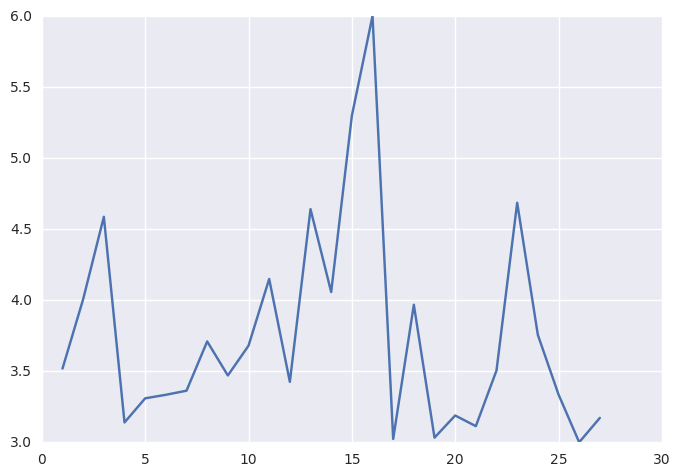

In [113]:
sizex = power_plant_Q.mean_thermal_Q.convert_objects(convert_numeric=True)
#sizex = np.log(sizex)/2
sizex = 3*( ((sizex-np.min(sizex))/(np.max(sizex) - np.min(sizex))) +1)
plt.plot(sizex)
plt.show()

/home/rniemeyr/anaconda/envs/cartopy/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  if __name__ == '__main__':


176232.36484


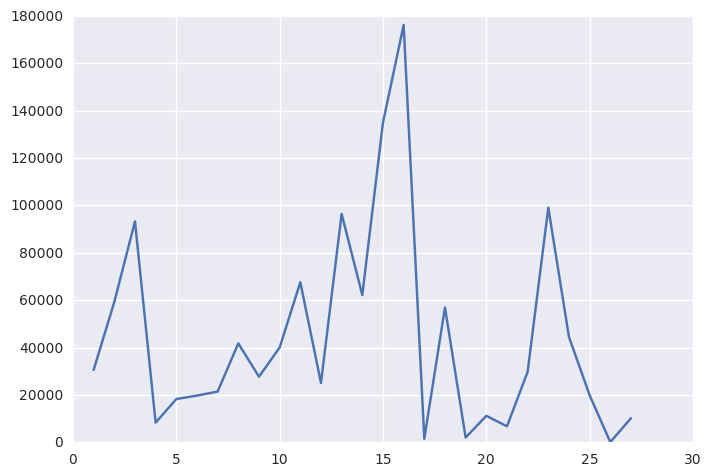

In [132]:
sizex = power_plant_Q.mean_thermal_Q.convert_objects(convert_numeric=True)
#sizex = np.log(sizex)/2
print(np.max(sizex))
plt.plot(sizex)
plt.show()

AttributeError: module 'numpy' has no attribute 'series'